# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys
from pytz import timezone
import pathlib

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import joblib

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from scipy.stats import pearsonr
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K
from tqdm.keras import TqdmCallback
from tensorflow.keras import optimizers

RESULT_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/seq2seq_pm25_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(RESULT_DIR).mkdir(parents=True, exist_ok=True)
print(RESULT_DIR)

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")
    os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = "true"

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction, plot_learning_curves
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice
from src.time_series_utils import splitTrainValidationTestTimeSeries, reframePastFuture, padPastFuture

# Checking Tensorflow
print(f"Tensorflow version: {tf.__version__}, GPUs: {tf.config.list_physical_devices('GPU')}")

E0000 00:00:1764827408.848704   41509 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764827408.855289   41509 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764827408.871801   41509 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764827408.871816   41509 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764827408.871818   41509 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764827408.871820   41509 computation_placer.cc:177] computation placer already registered. Please check linka

/le_thanh_van_118/workspace/hiep_workspace/seq2seq_pm25_results/2025_12_04-12_50_11
Using GPU to train
Tensorflow version: 2.19.1, GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# DATA FROM VIET

## Load dataset

In [3]:
dataset_path = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"

df_raw = []

for csv_file in sorted(glob.glob(f"{dataset_path}/*")):
    print(f"Working on {csv_file}")
    df_station = pd.read_csv(csv_file)
    df_station["station"] = int(os.path.splitext(os.path.basename(csv_file))[0])
    df_raw.append(df_station)
df_raw = pd.concat(df_raw, axis=0)

# Set time index
df_raw["date"] = pd.to_datetime(df_raw["date"])
df_raw.set_index("date", inplace=True)

# Drop columns
#features_to_use = ["pm25_quantrac", "tsp_quantrac", "station"]
#features_to_use = ["PM25_quantrac", "TSP_quantrac", "O3_quantrac", "CO_quantrac", "NO2_quantrac", "Temperature_quantrac", "Humid_quantrac", "station"]
features_to_use = ["PM25_quantrac", "TSP_quantrac", "station"]
df_raw = df_raw.loc[:, features_to_use]

df_raw

Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/211.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/212.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/213.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/214.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/215.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/216.csv


,PM25_quantrac,TSP_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


## Data preparation

### Drop missing

In [4]:
df = []
for station in sorted(df_raw["station"].unique()):
    df_station = df_raw[df_raw["station"] == station]
    df.append(df_station.dropna())
df = pd.concat(df, axis=0)
df

,PM25_quantrac,TSP_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


### Scale

In [5]:
df_scaled = copy.deepcopy(df)

# Scale label
label = "PM25_quantrac"
label_scaler = MinMaxScaler()
df_scaled[label] = label_scaler.fit_transform(df[[label]])

# Scale features
features_to_scale = features_to_use
features_to_scale.remove(label)
for f in features_to_scale:
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df[[f]])
    df_scaled[f] = scaled_data

# Drop station column
df_scaled = df_scaled.drop(columns=["station"], errors="ignore")

df_scaled

,PM25_quantrac,TSP_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


### Train test split

In [6]:
splitter = round(0.8 * len(df_scaled))
train_data = df_scaled.iloc[:splitter]
test_data = df_scaled.iloc[splitter:]

display(train_data)
display(test_data)

,PM25_quantrac,TSP_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2021-09-21 06:00:00,0.059110,0.052214
2021-09-21 07:00:00,0.065058,0.058590
2021-09-21 08:00:00,0.067930,0.060540


,PM25_quantrac,TSP_quantrac
date,,
2021-09-21 11:00:00,0.065315,0.057731
2021-09-21 12:00:00,0.059551,0.050703
2021-09-21 13:00:00,0.058597,0.048018
2021-09-21 14:00:00,0.053520,0.039493
2021-09-21 15:00:00,0.064546,0.053170
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


## Prediction

### Model paramaters

In [7]:
n_past = 168

epochs = 100
batch_size = 128

In [8]:
# Calculate MNBE
def mean_normalized_bias_error(y_pred, y_actual):
    y_pred = np.array(y_pred)
    y_actual = np.array(y_actual)
    return np.mean((y_pred - y_actual) / np.mean(y_actual)) * 100

metrics_calculators = {
    "mae": mean_absolute_error,
    "mse": mean_squared_error,
    "rmse": root_mean_squared_error,
    "r2": r2_score,
    "mape": mean_absolute_percentage_error,
    "mnbe": mean_normalized_bias_error,
    "r_coeff": lambda a,b: pearsonr(a, b)[0]
}

### Reframe data

In [9]:
# Function to reframe data
def reframe(input_data, n_past, n_future, n_shifted=0):
    data = copy.deepcopy(input_data)
    m = np.arange(0, len(data) - n_past - n_future - n_shifted + 1)
    X = np.array([data.iloc[i:(i + n_past), :] for i in m])
    label_index_col = 0
    y = np.expand_dims(np.array([data.iloc[(i + n_shifted + n_past):(i + n_shifted + n_past + n_future), 0] for i in m]), -1)
    return X, y

X_train_72h, y_train_72h = reframe(train_data, n_past, 72)
X_test_72h, y_test_72h = reframe(test_data, n_past, 72)
print(X_train_72h.shape, y_train_72h.shape, X_test_72h.shape, y_test_72h.shape)

(39699, 168, 2) (39699, 72, 1) (9746, 168, 2) (9746, 72, 1)


### Define callbacks

In [10]:
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, restore_best_weights=True),

### LSTM-Seq2Seq

In [11]:
def define_lstms2s_model(n_past, n_future, n_features, n_label, name="model"):
    inputs = Input(shape=(n_past, n_features))
    lstm_1 = LSTM(128, return_sequences=True, activation="relu")(inputs)
    lstm_2 = LSTM(64, activation="relu", dropout=0.2)(lstm_1)
    dense = Dense(32, activation="relu")(lstm_2)
    outputs = Dense(n_future)(dense)

    # Compile the model
    model = Model(inputs, outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 72 hours

I0000 00:00:1764827421.446530   41509 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 37263 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "PM25_quantrac_lstms2s_72h"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 168, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 168, 128)       │        67,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 72)             │         2,376 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,936 (472.41 KB)

 Trainable params: 120,936 (472.41 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100


I0000 00:00:1764827426.441094   41818 service.cc:152] XLA service 0x7a7c0800a300 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764827426.441126   41818 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1764827428.298495   41818 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1764827443.829773   41818 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


249/249 ━━━━━━━━━━━━━━━━━━━━ 81s 240ms/step - loss: 0.0551 - val_loss: 0.0299 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0511 - val_loss: 0.0301 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 234ms/step - loss: 0.0505 - val_loss: 0.0320 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 57s 230ms/step - loss: 0.0496 - val_loss: 0.0318 - learning_rate: 0.0010
Epoch 5/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0495 - val_loss: 0.0332 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step - loss: 0.0461
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 234ms/step - loss: 0.0487 - val_loss: 0.0327 - learning_rate: 0.0010
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0472 - val_loss: 0.0324 - learning_rate: 5.0000e-04
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 233ms/step - loss: 0.0462 - val

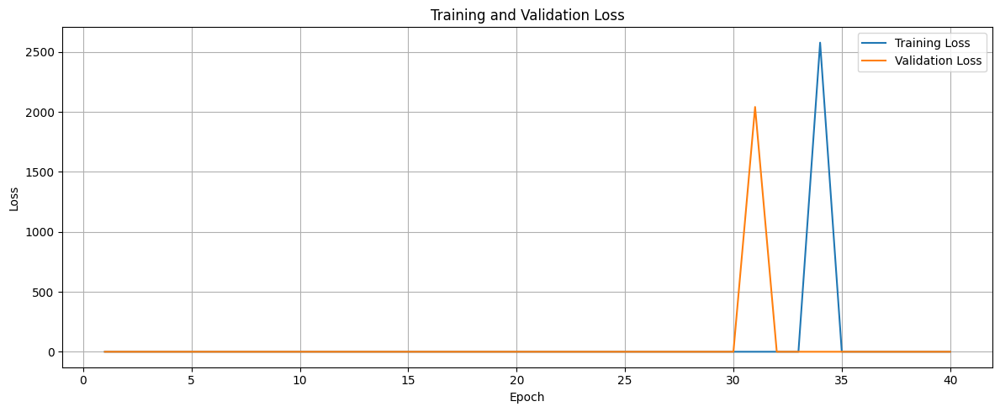

305/305 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step
y_pred.shape = (9746, 72)
inv_y_pred.shape = (9746, 72, 1)
inv_y_test.shape = (9746, 72, 1)
Day = 0
mae: 5.054844927540888
mse: 40.30557191306686
rmse: 6.348666939843897
r2: -0.7021122547844083
mape: 0.3337584402235426
mnbe: -24.144603611735644
r_coeff: [0.90925092]


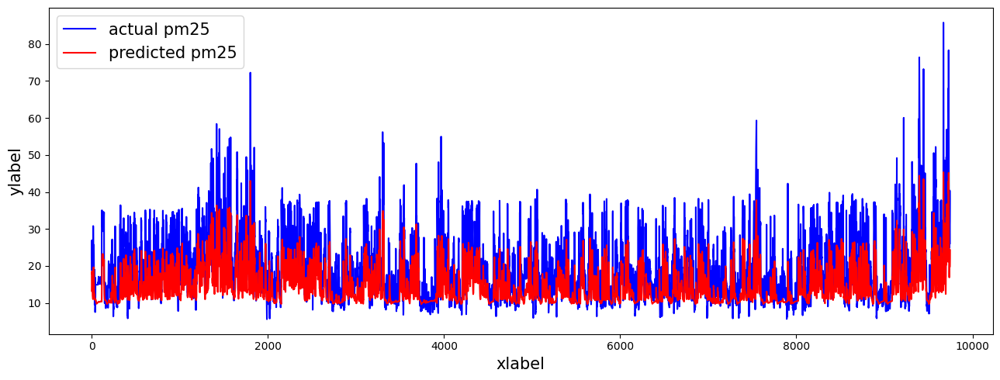

Day = 1
mae: 5.154673019644714
mse: 50.33446247043258
rmse: 7.0946784613844605
r2: -1.6025510772222806
mape: 0.33970010708295995
mnbe: -22.496714683313538
r_coeff: [0.7693801]


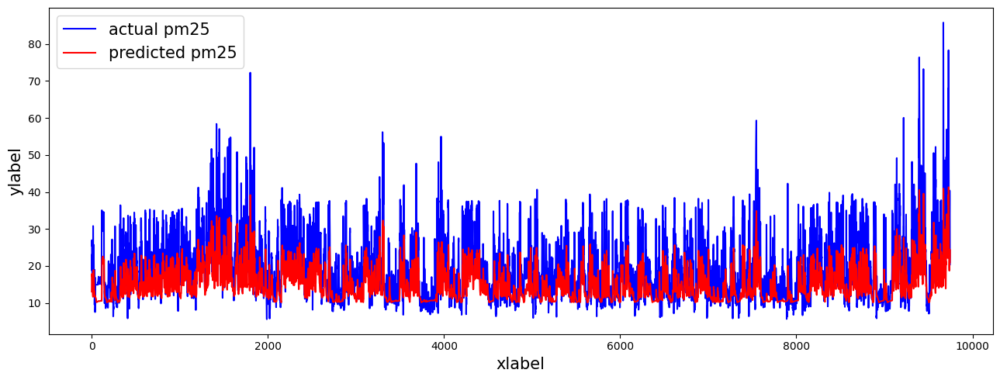

Day = 2
mae: 5.412717476051499
mse: 59.091201408358344
rmse: 7.687080161437003
r2: -2.980283292408153
mape: 0.3573727405336119
mnbe: -21.96778278623942
r_coeff: [0.65633644]


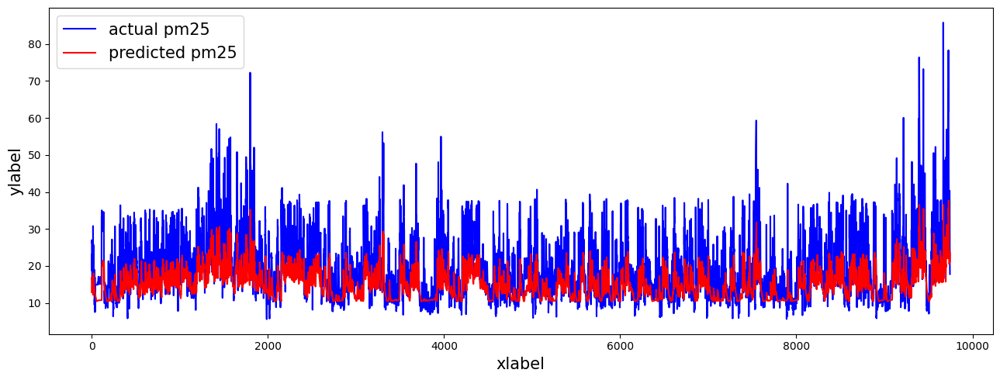

Day = 3
mae: 5.508247479757905
mse: 62.67557079571579
rmse: 7.916790435253152
r2: -3.553190783213166
mape: 0.3620755015773891
mnbe: -20.800228588633882
r_coeff: [0.5754288]


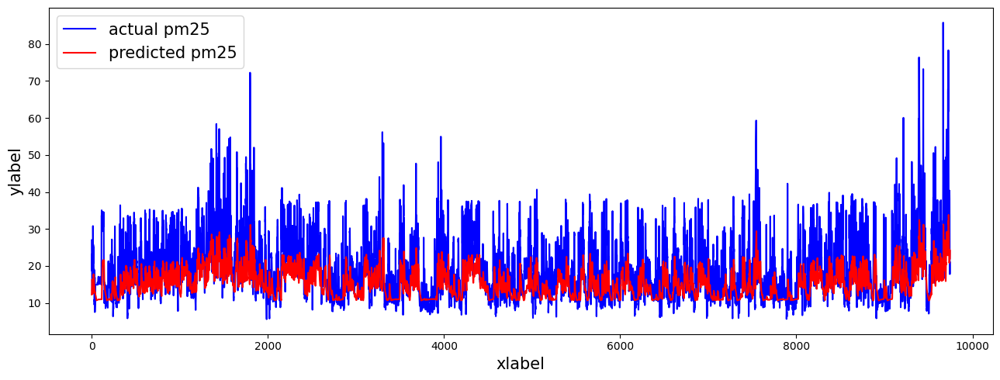

Day = 4
mae: 5.650973850913533
mse: 66.63151896568517
rmse: 8.162813177188681
r2: -4.712698815809503
mape: 0.37177314302501674
mnbe: -20.51391664312164
r_coeff: [0.50993776]


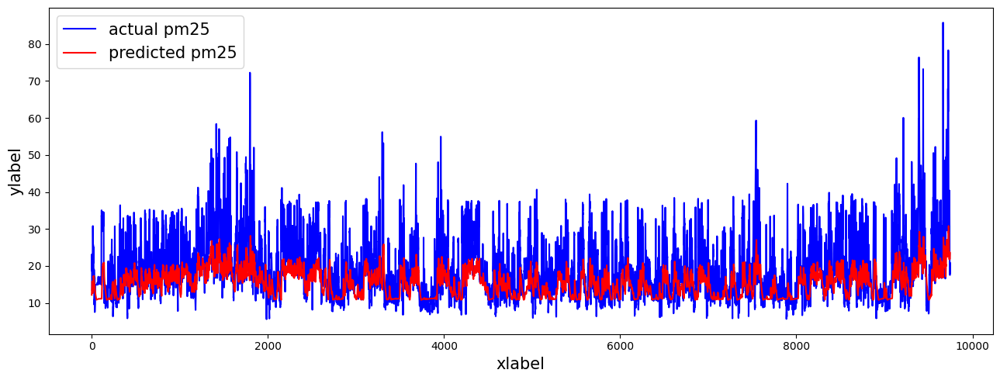

Day = 5
mae: 5.613498053201819
mse: 66.01393092027115
rmse: 8.124895748270937
r2: -5.1769334359346715
mape: 0.3596075407740868
mnbe: -18.582308003729857
r_coeff: [0.47457627]


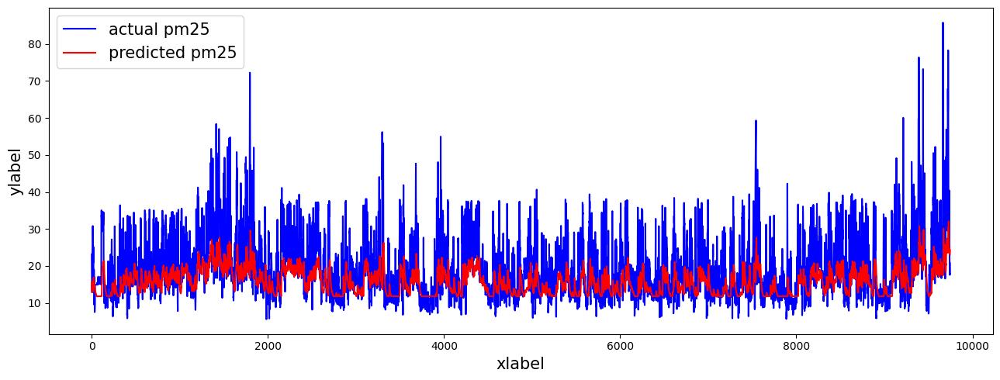

Day = 6
mae: 5.696679732440516
mse: 67.52704451357447
rmse: 8.217484074433882
r2: -5.0429322725651495
mape: 0.36550262805633277
mnbe: -17.834983882364476
r_coeff: [0.42735508]


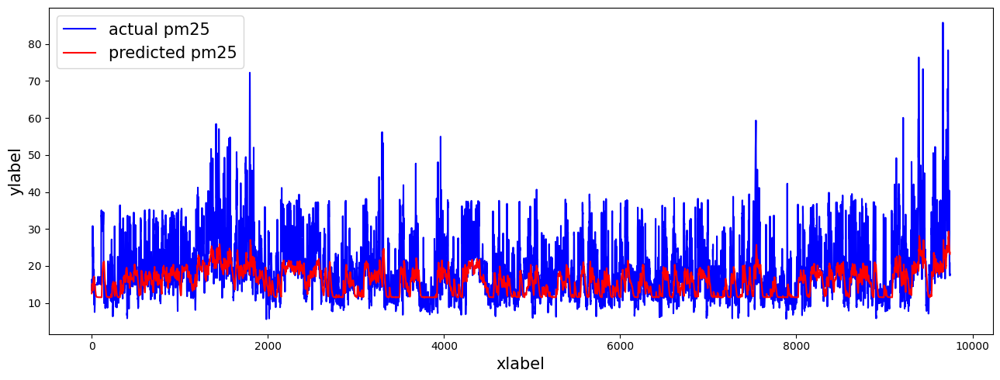

Day = 7
mae: 5.767549260843354
mse: 68.96232312101954
rmse: 8.30435567163519
r2: -5.007978071498169
mape: 0.37271459938867435
mnbe: -17.82938283341357
r_coeff: [0.40130898]


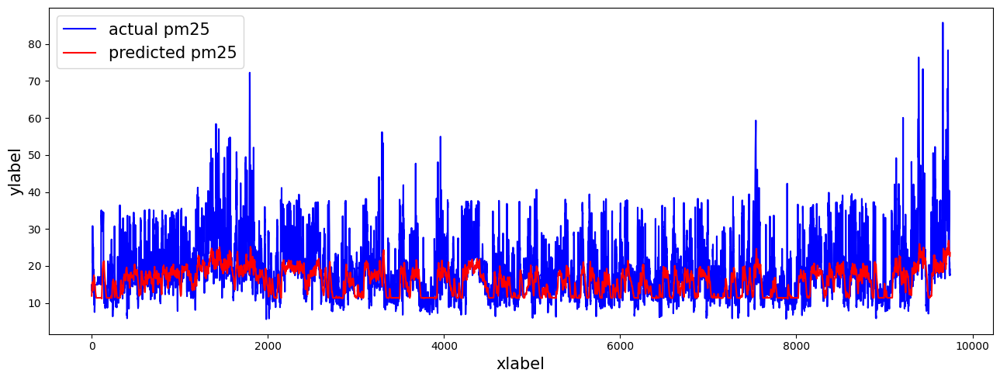

Day = 8
mae: 5.799125131212012
mse: 70.10541562475689
rmse: 8.37289768388202
r2: -5.862769299479128
mape: 0.37471204320901974
mnbe: -18.196617915895654
r_coeff: [0.38905016]


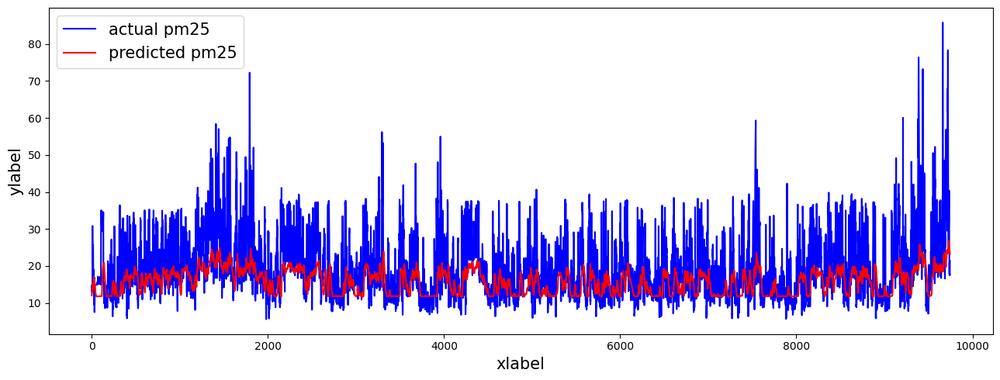

Day = 9
mae: 5.795834156906714
mse: 69.45259684617669
rmse: 8.333822463082393
r2: -5.037096912561657
mape: 0.3719709708552489
mnbe: -17.014113400229984
r_coeff: [0.37396767]


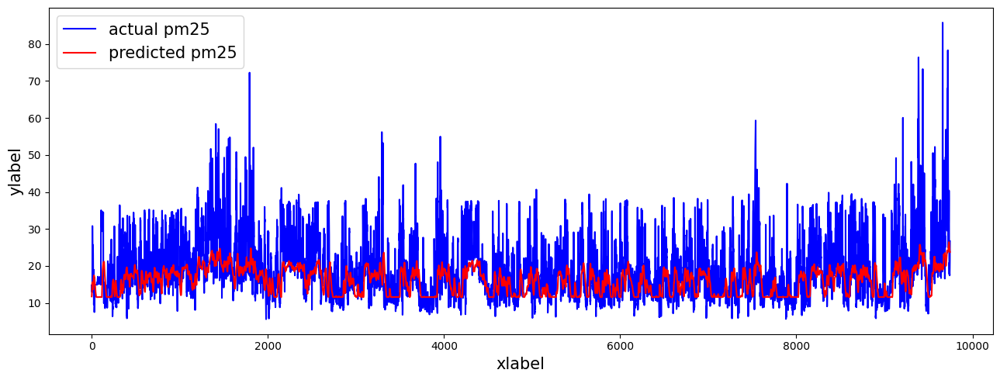

Day = 10
mae: 5.766733042935665
mse: 67.98675489280926
rmse: 8.245408109536438
r2: -4.120411183429749
mape: 0.36551800159483117
mnbe: -15.460186615889004
r_coeff: [0.37111539]


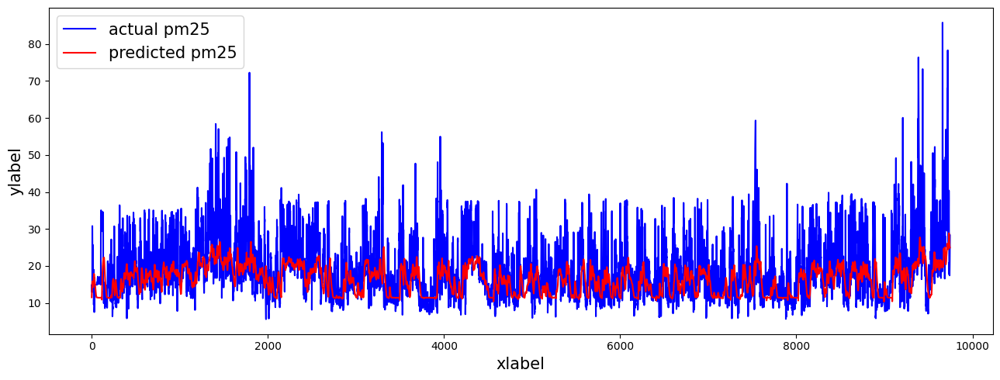

Day = 11
mae: 5.779521214463823
mse: 68.08651324668844
rmse: 8.25145521994081
r2: -4.44080455726092
mape: 0.3652446836994366
mnbe: -15.471303636564295
r_coeff: [0.3685425]


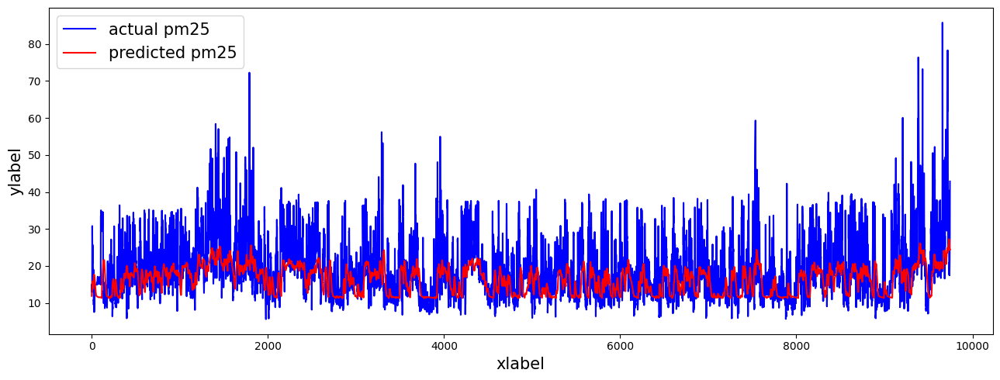

Day = 12
mae: 5.808808732738071
mse: 69.03999613604361
rmse: 8.309030998620935
r2: -4.475844256216758
mape: 0.3707784311105692
mnbe: -16.163157417574208
r_coeff: [0.36811913]


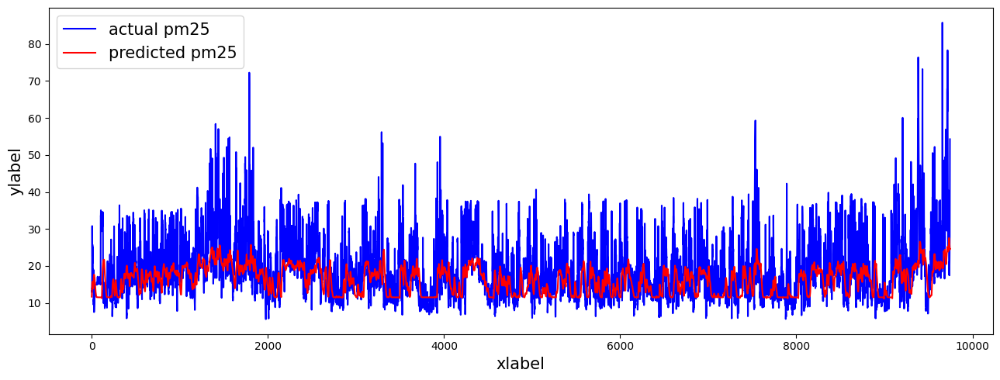

Day = 13
mae: 5.774315656074676
mse: 68.1366383719987
rmse: 8.254492011747223
r2: -4.614542096205444
mape: 0.3646933834106358
mnbe: -15.783888405426403
r_coeff: [0.37658117]


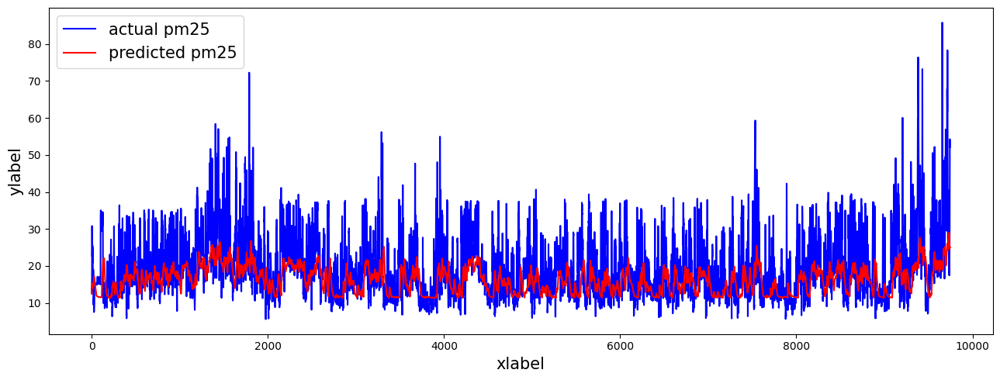

Day = 14
mae: 5.786000010127653
mse: 68.43360508589537
rmse: 8.272460642752879
r2: -4.405386746820072
mape: 0.366893765495507
mnbe: -15.847381802440788
r_coeff: [0.37449968]


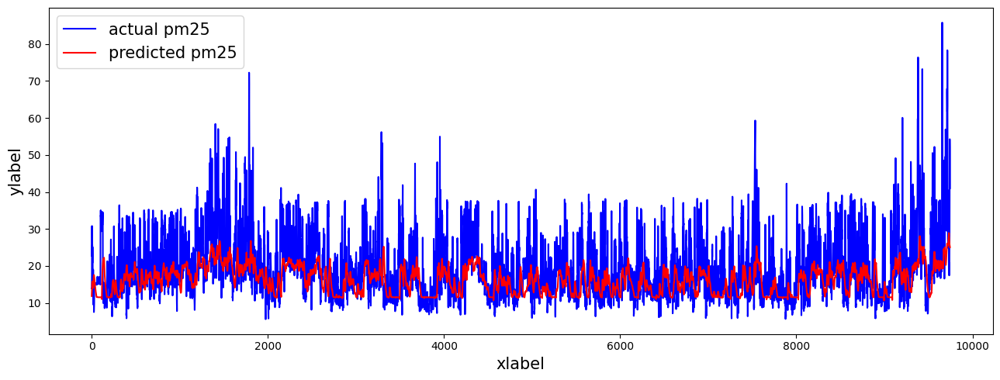

Day = 15
mae: 5.801638922798287
mse: 68.5775683747118
rmse: 8.28115742965389
r2: -4.316200977306173
mape: 0.36870233849620293
mnbe: -15.91043826076977
r_coeff: [0.37408536]


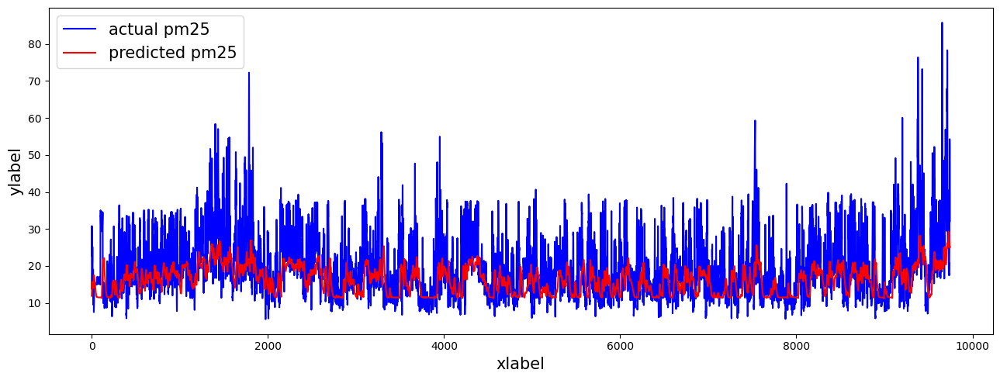

Day = 16
mae: 5.899295629924999
mse: 71.4672724774841
rmse: 8.453831822167041
r2: -5.381468605768977
mape: 0.38353008498608954
mnbe: -18.00496694317802
r_coeff: [0.36598181]


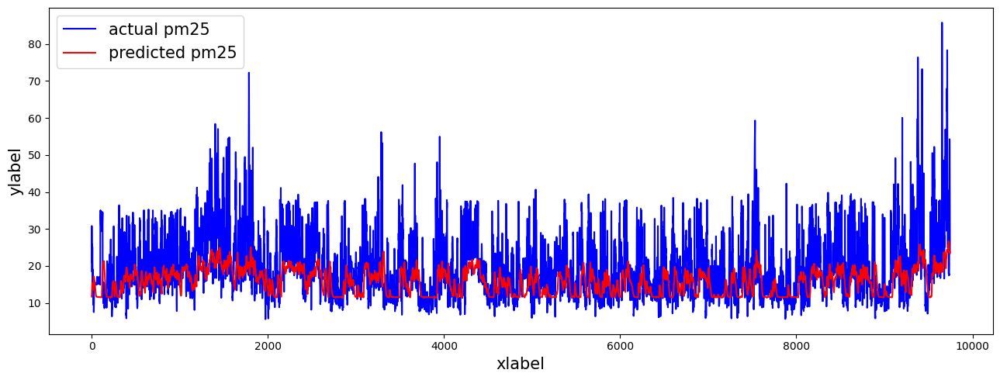

Day = 17
mae: 5.887308775037174
mse: 71.25085479165192
rmse: 8.441022141402776
r2: -5.231054718802102
mape: 0.3823755203648459
mnbe: -18.122589236686487
r_coeff: [0.37316149]


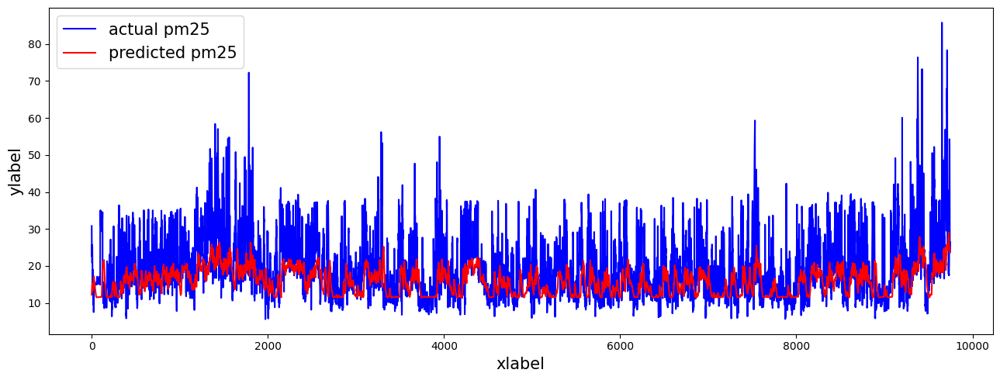

Day = 18
mae: 5.911232908080546
mse: 71.78476296577759
rmse: 8.472588917549205
r2: -5.308178631761595
mape: 0.38530202495343385
mnbe: -18.482987203906017
r_coeff: [0.3727041]


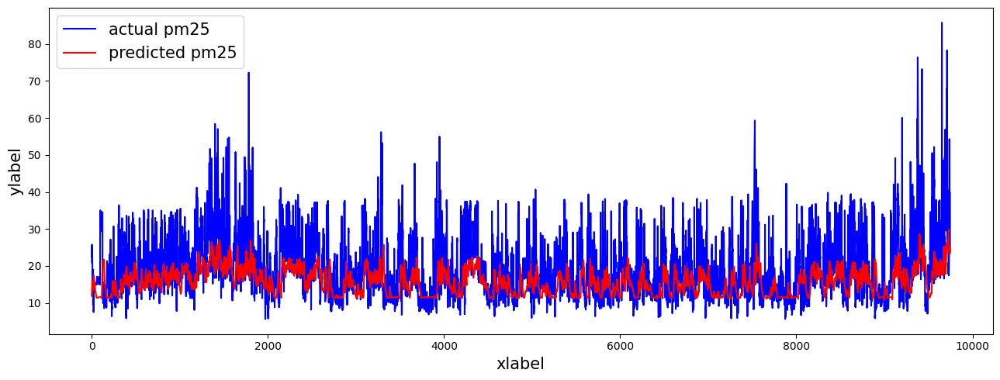

Day = 19
mae: 5.88278202332938
mse: 70.78954074090989
rmse: 8.413652045390865
r2: -4.818809260352637
mape: 0.3803586661343423
mnbe: -17.659507805867943
r_coeff: [0.37314808]


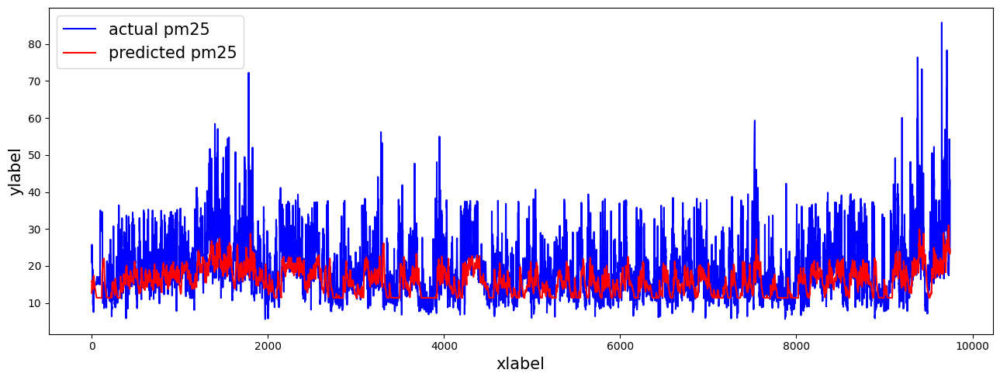

Day = 20
mae: 5.918087789044256
mse: 71.84515690514824
rmse: 8.476152246458781
r2: -5.393356417402787
mape: 0.3836584778574817
mnbe: -18.27214766225074
r_coeff: [0.36748434]


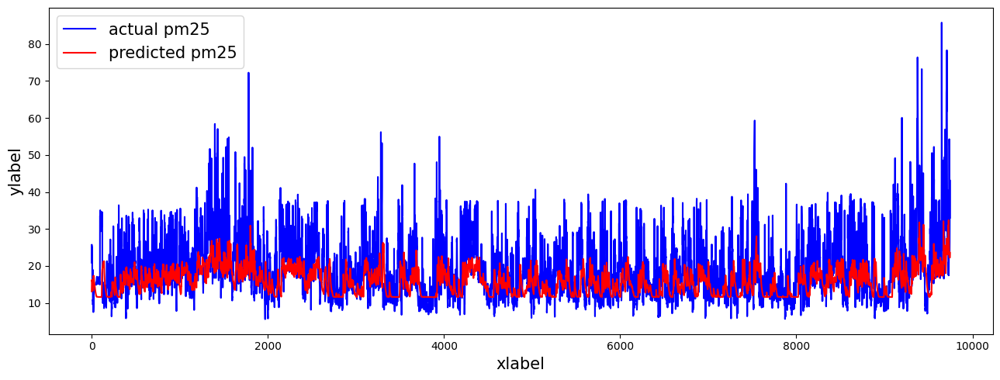

Day = 21
mae: 5.972603237312365
mse: 73.19344055093431
rmse: 8.555316507934368
r2: -5.326808892016461
mape: 0.391411451309773
mnbe: -19.053616399655468
r_coeff: [0.36376959]


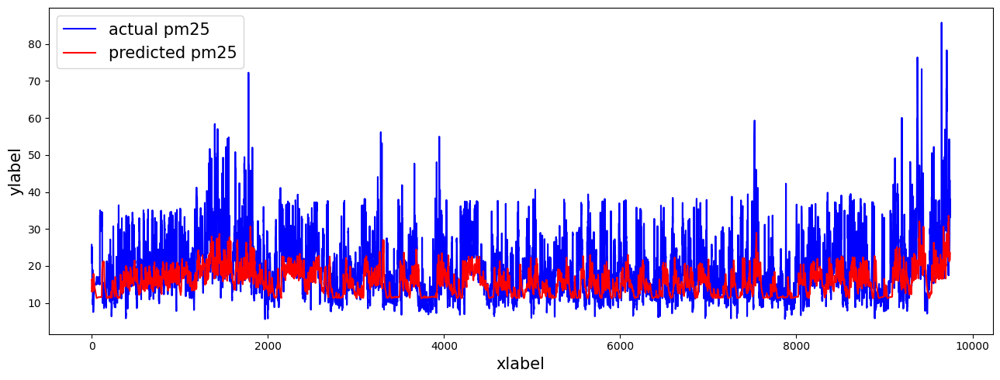

Day = 22
mae: 5.985150526239581
mse: 73.52344617730647
rmse: 8.5745813995382
r2: -5.878987532062571
mape: 0.39044418076349363
mnbe: -19.161882285760356
r_coeff: [0.35959864]


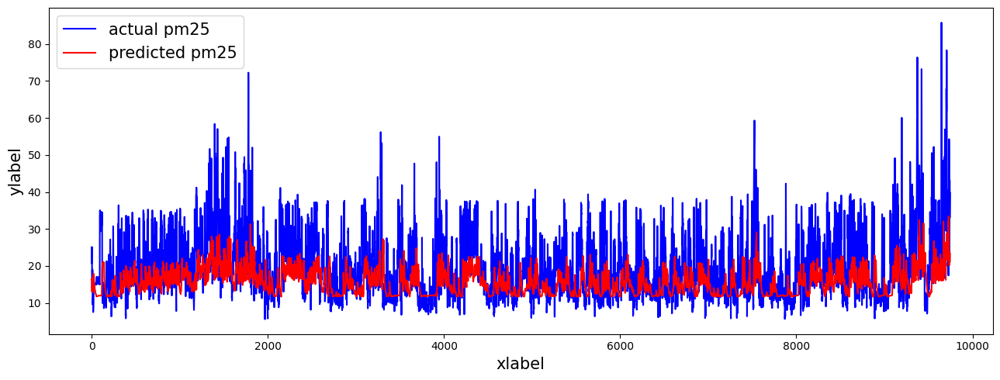

Day = 23
mae: 5.994550496875498
mse: 73.35680774488038
rmse: 8.564858886454603
r2: -5.876782089676944
mape: 0.39003087549291915
mnbe: -18.7039674318195
r_coeff: [0.35126382]


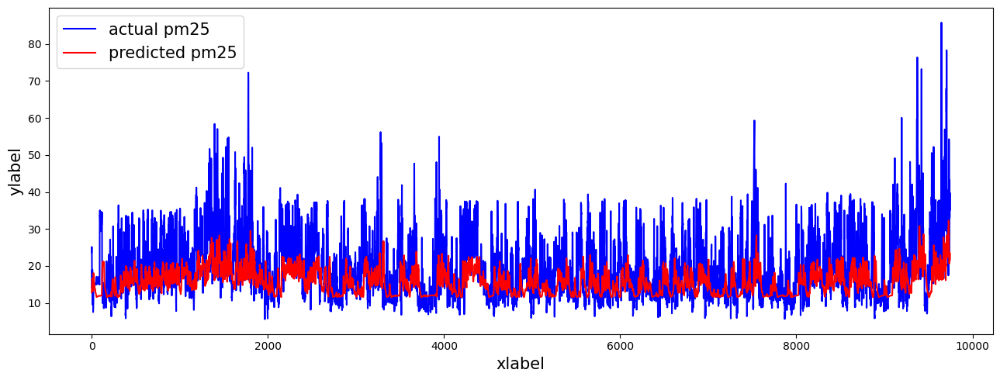

Day = 24
mae: 6.0182628389123
mse: 73.79249641969714
rmse: 8.590255899546715
r2: -6.639054293443224
mape: 0.3890055046835393
mnbe: -18.397250816538683
r_coeff: [0.33311438]


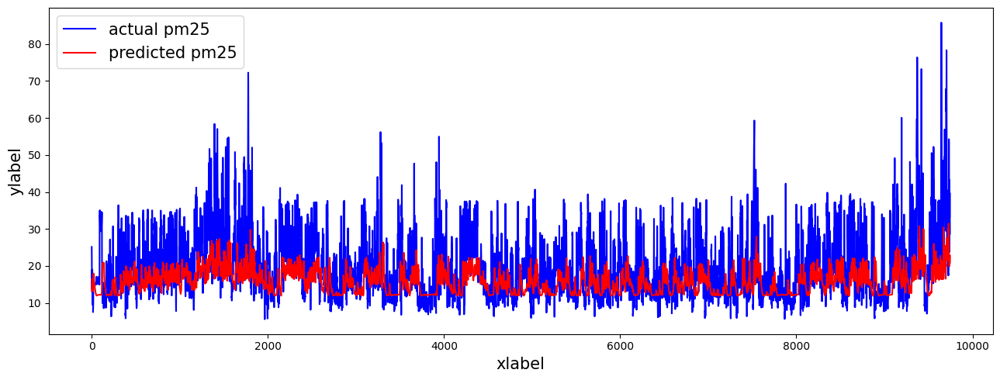

Day = 25
mae: 6.049648279577926
mse: 74.39510732554851
rmse: 8.625259841045283
r2: -7.3437919038167365
mape: 0.39082296525538174
mnbe: -18.108359718998567
r_coeff: [0.31161524]


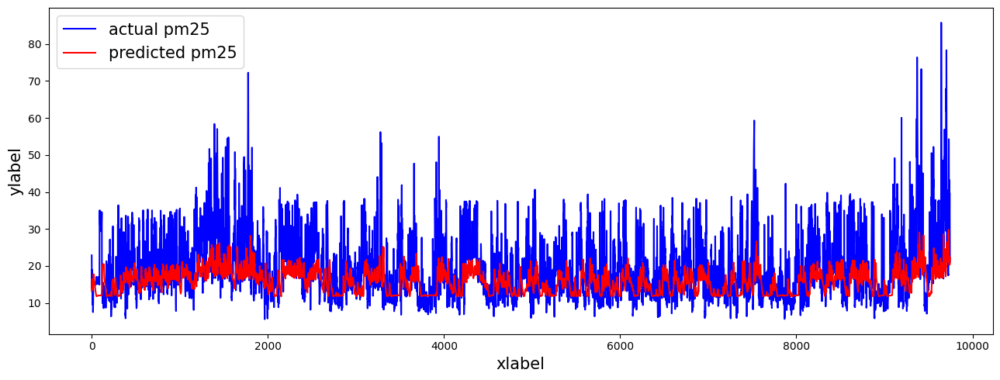

Day = 26
mae: 5.995180632641198
mse: 72.8383808513856
rmse: 8.534540459297478
r2: -7.708771197849202
mape: 0.3784495183042027
mnbe: -16.403945360922872
r_coeff: [0.29734032]


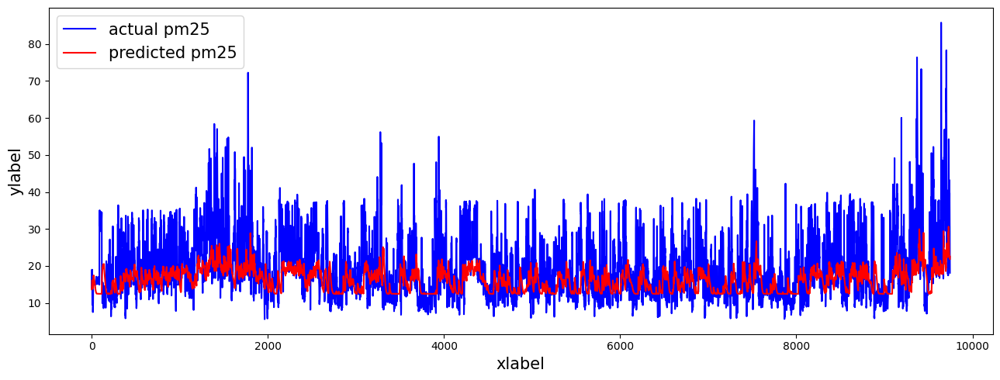

Day = 27
mae: 5.972877372925376
mse: 71.64425167280913
rmse: 8.464292744985203
r2: -6.57201411659321
mape: 0.37139460095205773
mnbe: -14.847031021693866
r_coeff: [0.28923614]


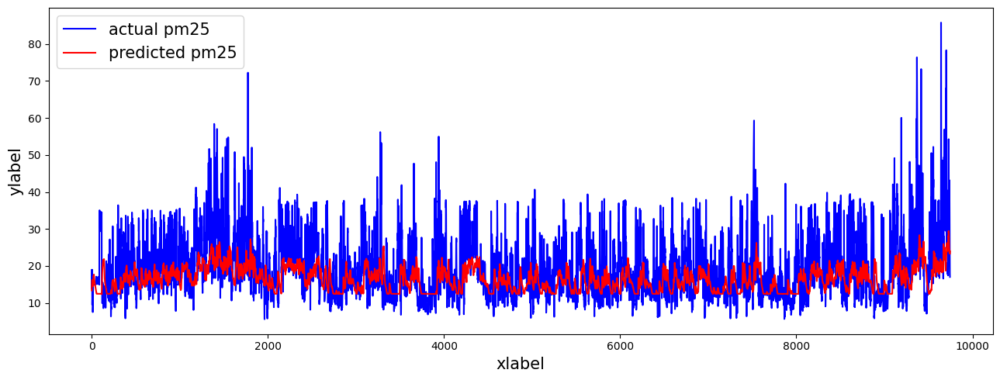

Day = 28
mae: 5.996150922477414
mse: 72.58263088053474
rmse: 8.51954405355913
r2: -7.8558529704677085
mape: 0.3742311561072704
mnbe: -15.296695525739699
r_coeff: [0.27485832]


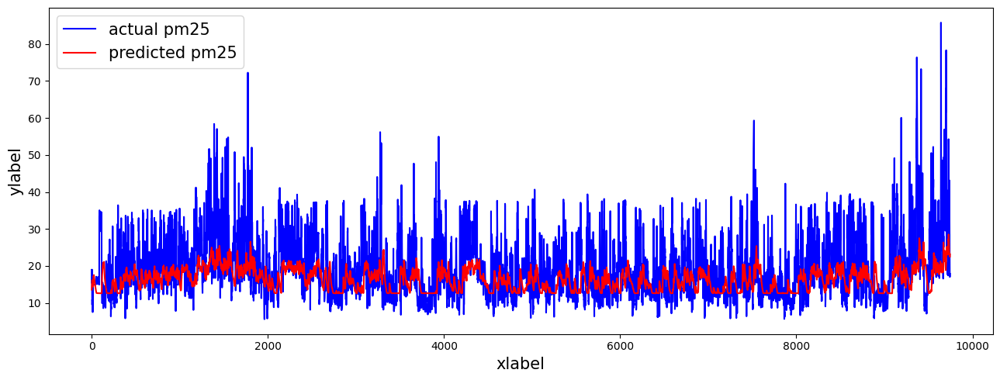

Day = 29
mae: 6.008832712703454
mse: 72.34461382102573
rmse: 8.505563698017065
r2: -7.202435697212447
mape: 0.3730014241835226
mnbe: -14.573747604229325
r_coeff: [0.26626143]


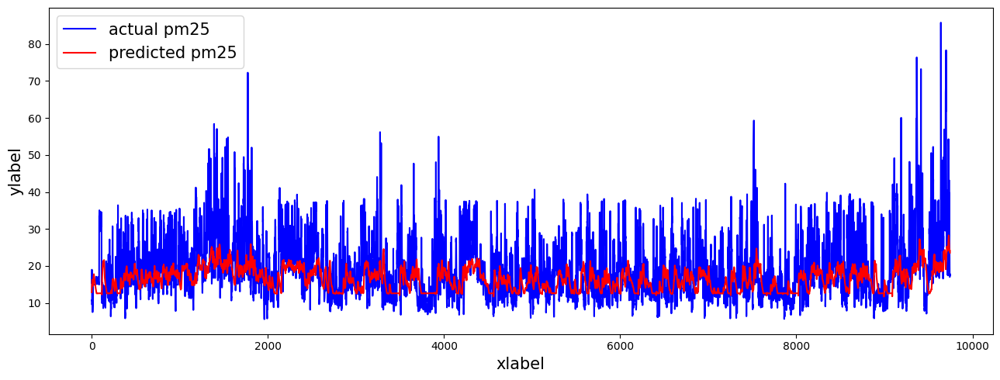

Day = 30
mae: 6.016624430668954
mse: 72.28137234351999
rmse: 8.501845231684706
r2: -7.431663716562207
mape: 0.3717528169733331
mnbe: -14.174848129990322
r_coeff: [0.25756254]


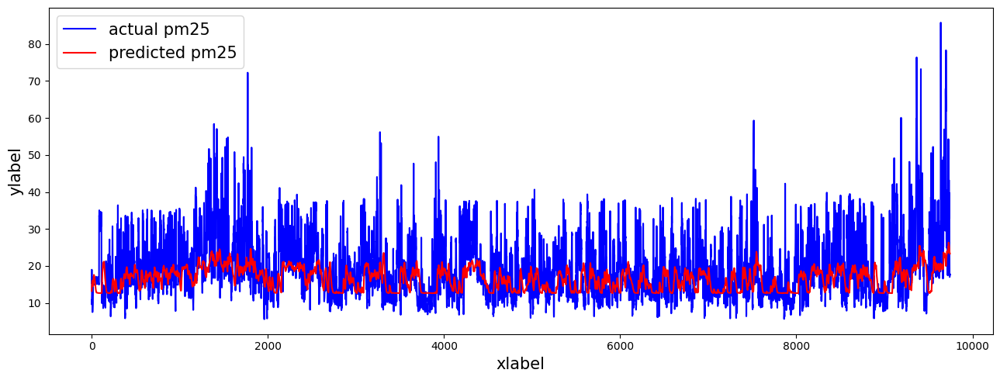

Day = 31
mae: 6.002707706302712
mse: 71.55752116536766
rmse: 8.459167876651206
r2: -7.480215006676959
mape: 0.3667496364226784
mnbe: -13.345772172986573
r_coeff: [0.25434415]


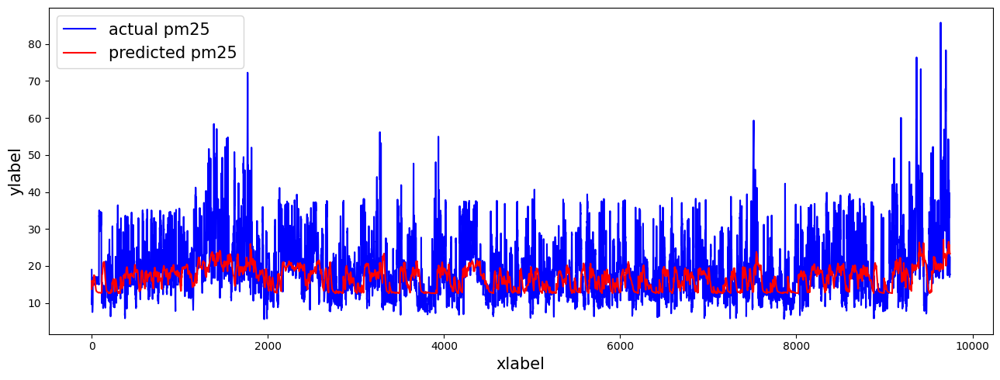

Day = 32
mae: 6.026643080068213
mse: 72.57231269454908
rmse: 8.518938472283333
r2: -7.649848087349872
mape: 0.3728018980970895
mnbe: -14.152732080199861
r_coeff: [0.25029974]


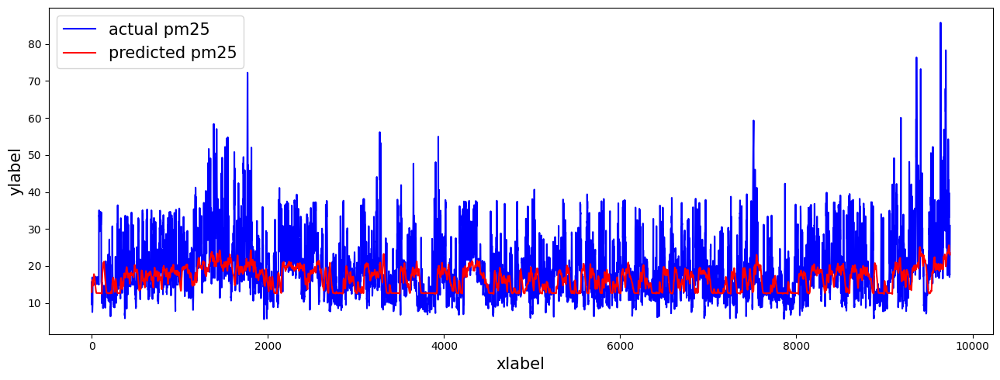

Day = 33
mae: 6.040388593964155
mse: 72.68915880453761
rmse: 8.525793734576132
r2: -6.983636052857678
mape: 0.3729867290611261
mnbe: -13.79793543729328
r_coeff: [0.24584506]


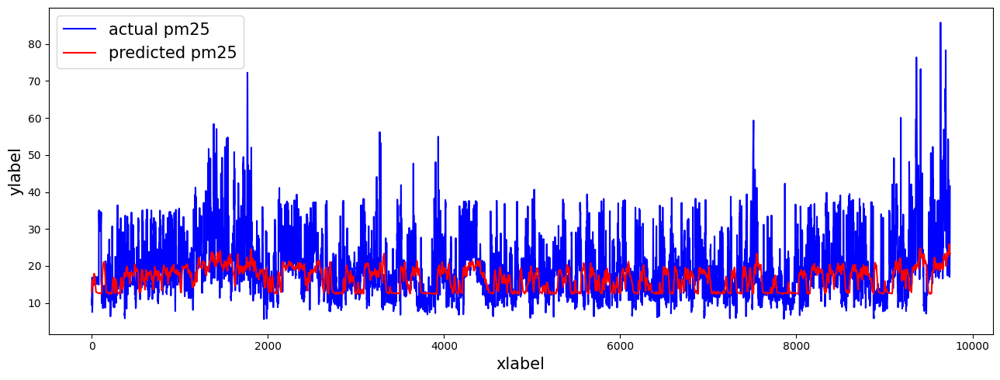

Day = 34
mae: 6.02532250460103
mse: 72.61648935446814
rmse: 8.521530927859626
r2: -7.094794702814035
mape: 0.37216787001805735
mnbe: -13.990817829421815
r_coeff: [0.25247568]


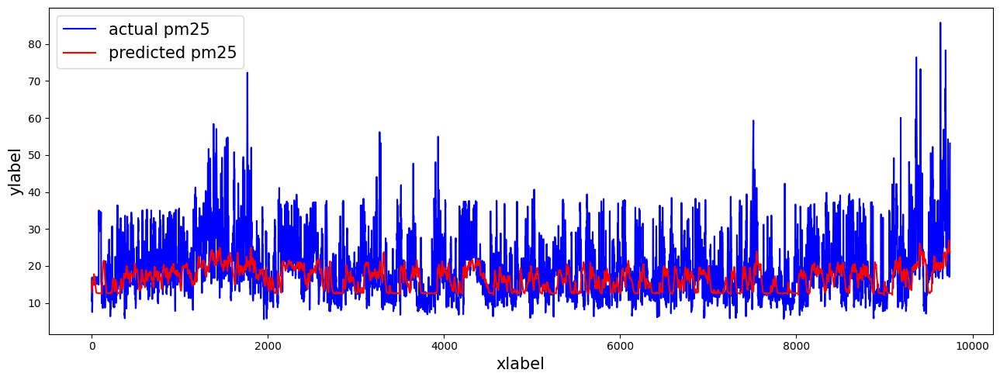

Day = 35
mae: 6.0034541056507615
mse: 72.27194412973319
rmse: 8.501290733161241
r2: -7.40906847062263
mape: 0.36902316779596844
mnbe: -13.92632173456034
r_coeff: [0.25824412]


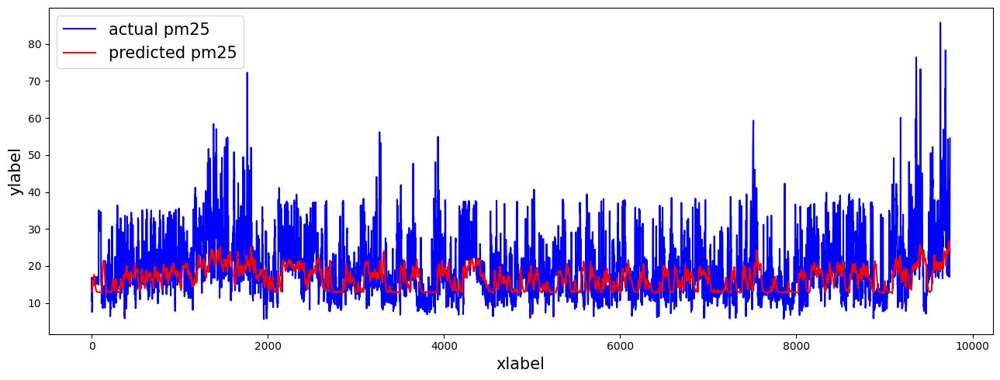

Day = 36
mae: 6.006754434120592
mse: 72.37642935742657
rmse: 8.507433770381441
r2: -7.3350960959031735
mape: 0.36963424691943614
mnbe: -13.929689808790933
r_coeff: [0.25914325]


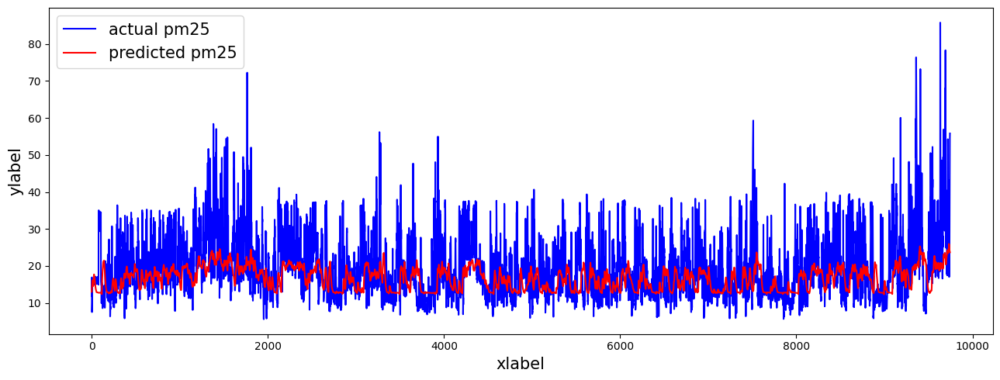

Day = 37
mae: 5.981369230092525
mse: 72.00919690773216
rmse: 8.485823289919026
r2: -7.808502187085784
mape: 0.36699571229092126
mnbe: -14.056689541307819
r_coeff: [0.26904673]


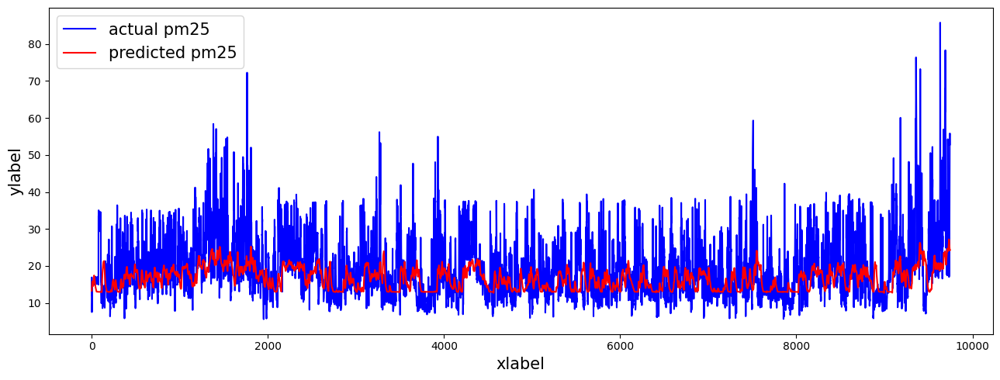

Day = 38
mae: 6.033955237653491
mse: 73.6753424819045
rmse: 8.583434189291864
r2: -7.87910176874731
mape: 0.3763123753973894
mnbe: -15.214396167624479
r_coeff: [0.26258055]


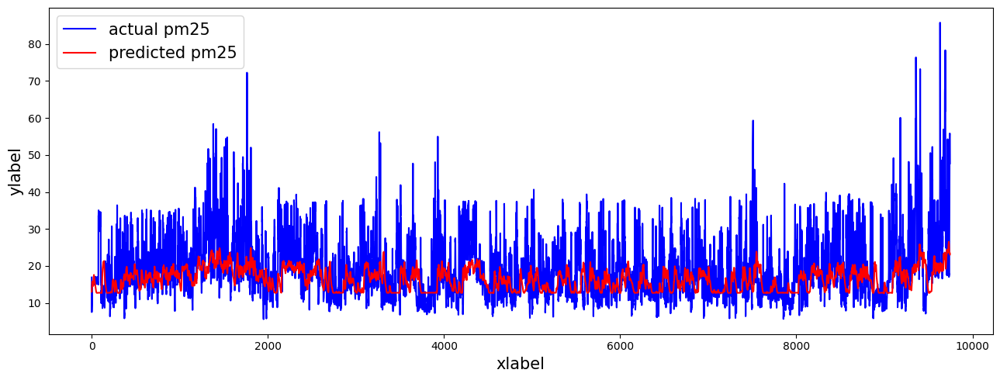

Day = 39
mae: 6.020219053680943
mse: 72.53344554607023
rmse: 8.516656946600012
r2: -6.7724214999266135
mape: 0.37076734793629723
mnbe: -13.773645293136342
r_coeff: [0.26077031]


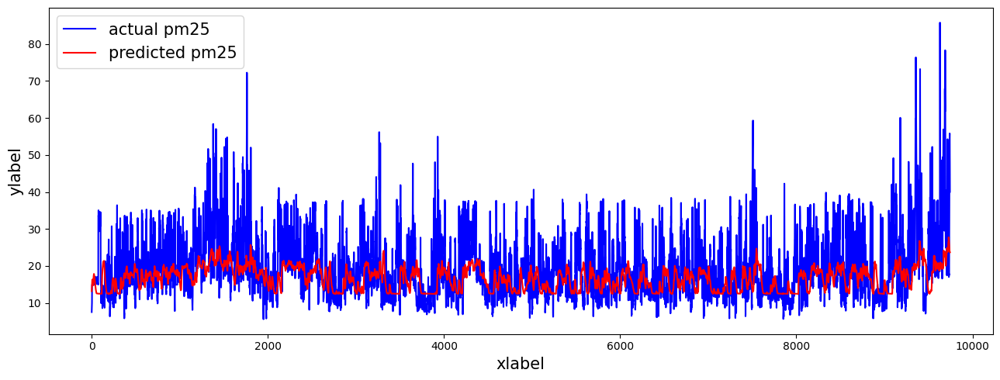

Day = 40
mae: 6.040408443264904
mse: 73.9550577763047
rmse: 8.599712656612702
r2: -8.00419181669191
mape: 0.3781702191850988
mnbe: -15.48457917295663
r_coeff: [0.26375836]


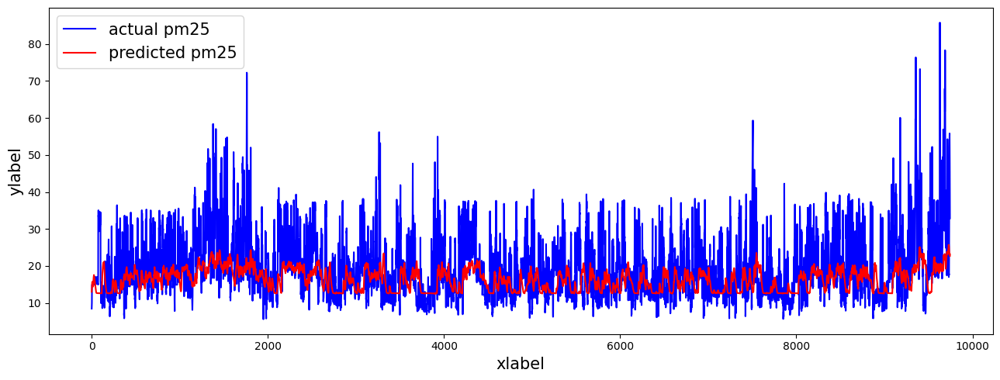

Day = 41
mae: 6.0523924686880894
mse: 74.29745220671413
rmse: 8.619596986327965
r2: -7.758602449683085
mape: 0.3801499883303854
mnbe: -15.819111974102073
r_coeff: [0.26592635]


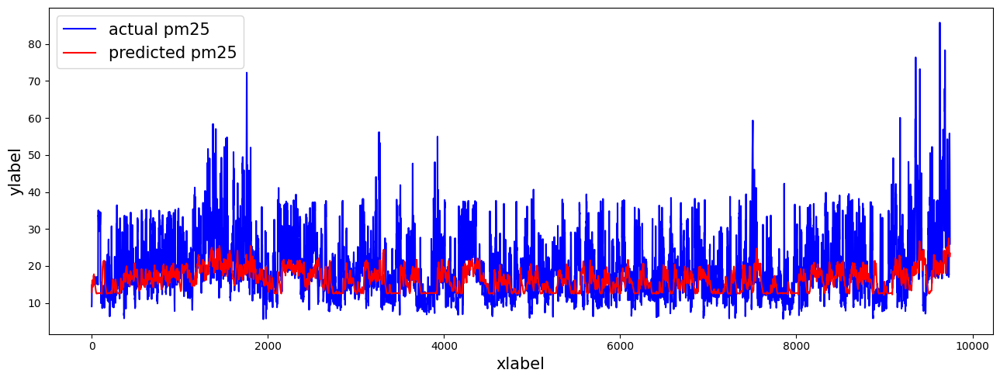

Day = 42
mae: 6.051225467523516
mse: 74.08659688853243
rmse: 8.607357137271139
r2: -7.5905440105788795
mape: 0.37933085312520853
mnbe: -15.540043138214832
r_coeff: [0.2641514]


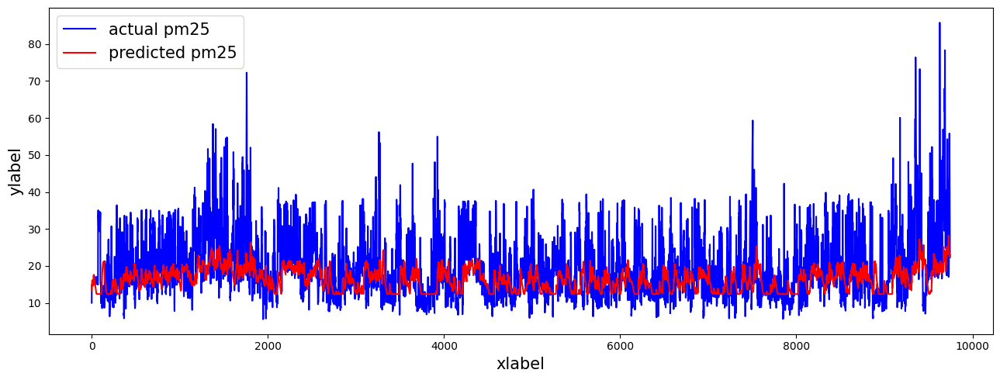

Day = 43
mae: 6.058810456768502
mse: 74.05151116256333
rmse: 8.605318771699473
r2: -7.478436211083091
mape: 0.3791092202943855
mnbe: -15.350633572659081
r_coeff: [0.26120966]


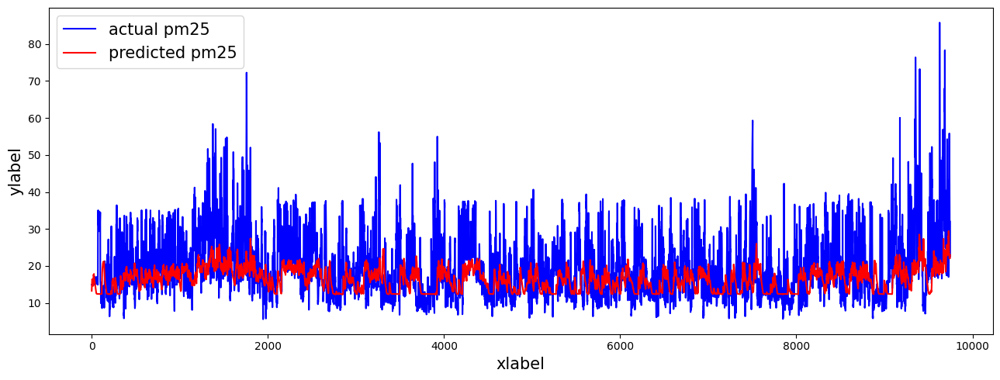

Day = 44
mae: 6.057164064106424
mse: 74.4230321713052
rmse: 8.626878472037566
r2: -8.906337217056098
mape: 0.3799134501443801
mnbe: -16.21492352230588
r_coeff: [0.26939217]


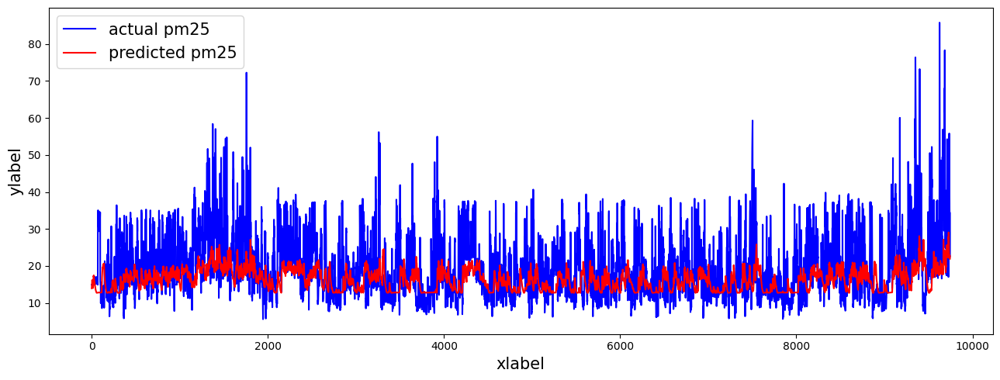

Day = 45
mae: 6.082107660800036
mse: 75.06509690574798
rmse: 8.664011594275944
r2: -9.210792052828438
mape: 0.3832423339572566
mnbe: -16.41945194682814
r_coeff: [0.26103139]


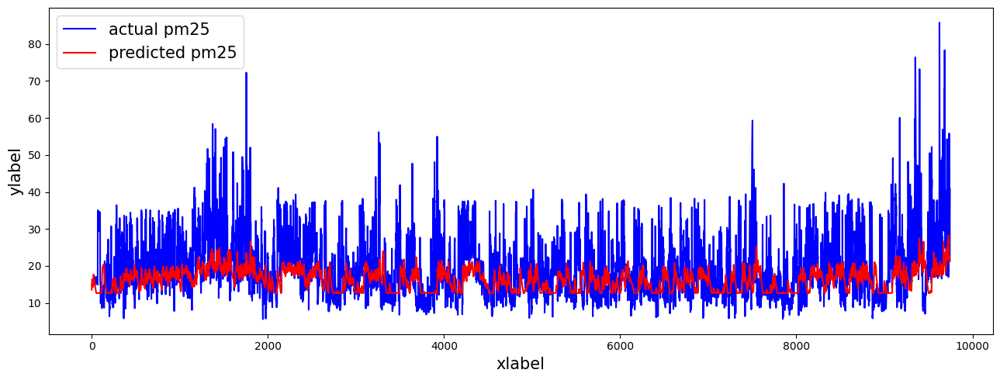

Day = 46
mae: 6.081103691390295
mse: 75.1333113657095
rmse: 8.667947355960896
r2: -10.332079031836853
mape: 0.3824042532377431
mnbe: -16.778398823392564
r_coeff: [0.26870296]


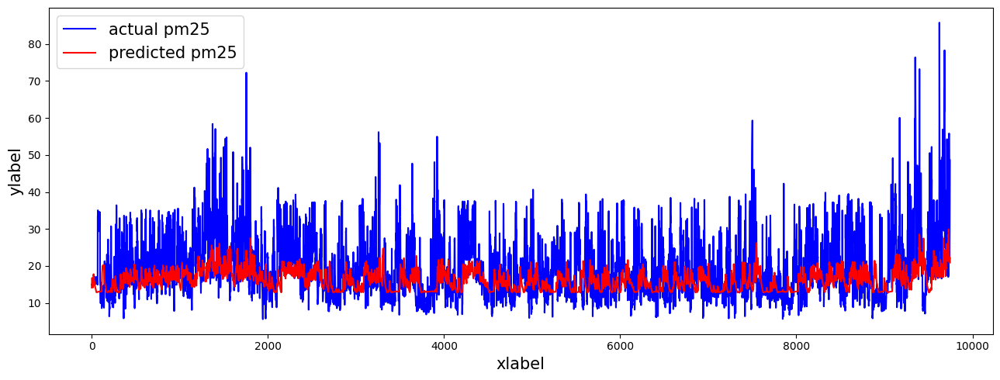

Day = 47
mae: 6.103235674878195
mse: 75.43272747816081
rmse: 8.685201637161962
r2: -9.347552236951291
mape: 0.38456777836197986
mnbe: -16.560138756568538
r_coeff: [0.25828239]


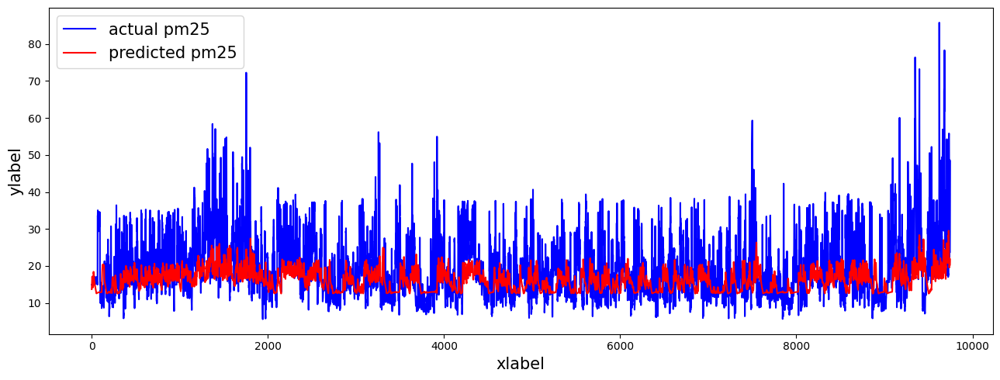

Day = 48
mae: 6.066642140623684
mse: 74.40573000899779
rmse: 8.625875608249737
r2: -9.598770337659353
mape: 0.37759304117729775
mnbe: -15.728785853760357
r_coeff: [0.25784874]


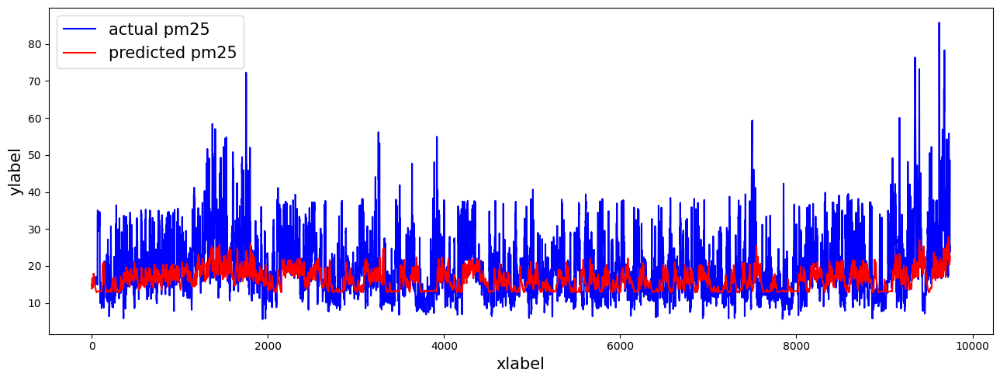

Day = 49
mae: 6.037617187162841
mse: 73.11499794275178
rmse: 8.550730842609408
r2: -9.706359090854084
mape: 0.36786323943502175
mnbe: -13.793917420129201
r_coeff: [0.23823303]


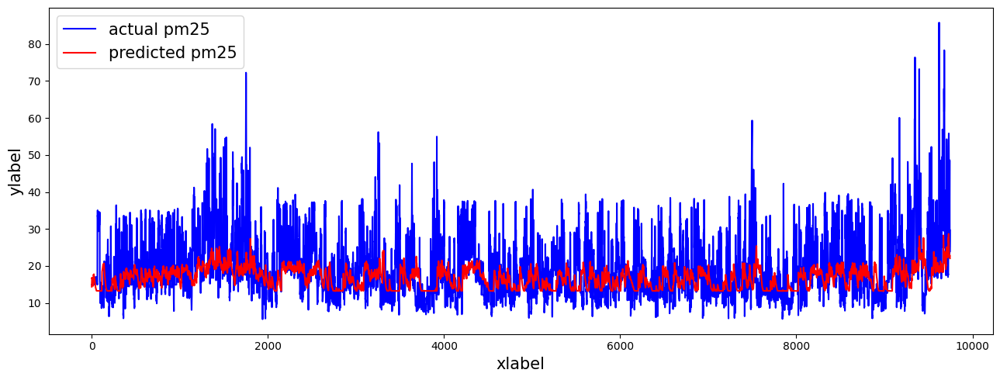

Day = 50
mae: 6.073947116434131
mse: 73.8539449457361
rmse: 8.593831796453554
r2: -9.605766048636083
mape: 0.36998011376235523
mnbe: -13.617324883431165
r_coeff: [0.21808056]


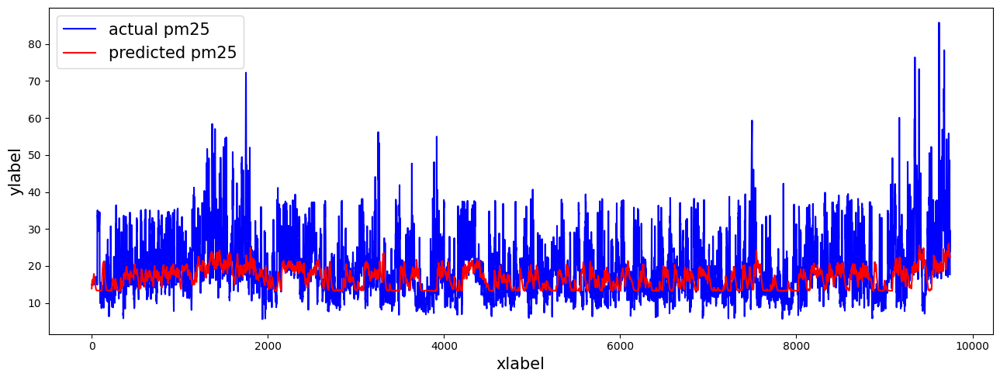

Day = 51
mae: 6.078753267911985
mse: 74.18749617250856
rmse: 8.613216366288993
r2: -11.071379798408053
mape: 0.3707846993591629
mnbe: -13.895241663567564
r_coeff: [0.21116709]


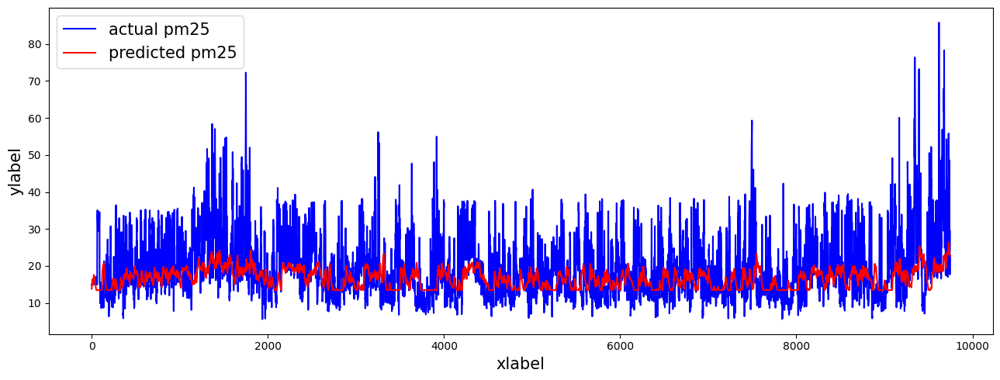

Day = 52
mae: 6.097084873503907
mse: 74.4079742654114
rmse: 8.626005695883315
r2: -11.009062376953318
mape: 0.3716450206557044
mnbe: -13.621680293385968
r_coeff: [0.19948339]


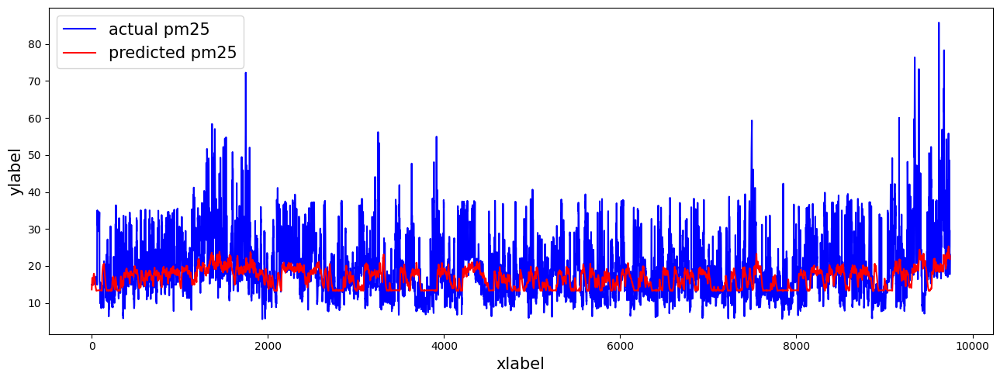

Day = 53
mae: 6.091699050590366
mse: 73.9307435913712
rmse: 8.598298877764787
r2: -10.695533896002809
mape: 0.3684914039303297
mnbe: -12.977601682217104
r_coeff: [0.19668184]


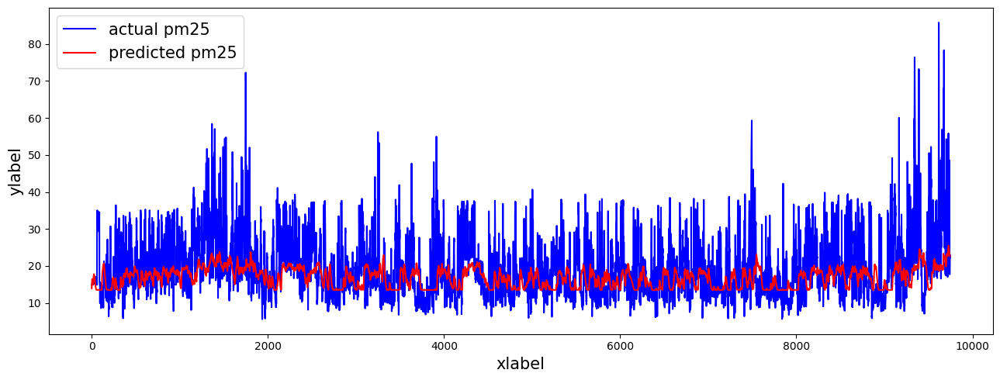

Day = 54
mae: 6.101110522850657
mse: 73.88463057829277
rmse: 8.595616939946357
r2: -9.88385531661244
mape: 0.3677629036466883
mnbe: -12.660082523235866
r_coeff: [0.19461248]


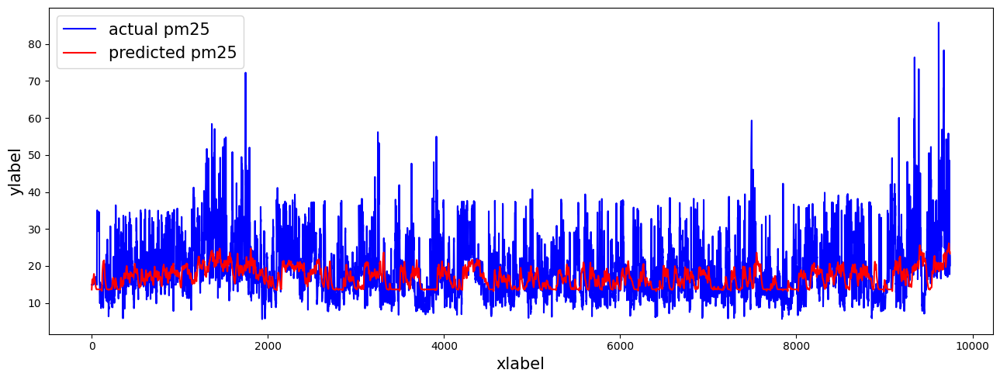

Day = 55
mae: 6.127323509672008
mse: 75.07360028127339
rmse: 8.664502310073752
r2: -9.973030941077578
mape: 0.37430811848579315
mnbe: -13.488024113776142
r_coeff: [0.18622631]


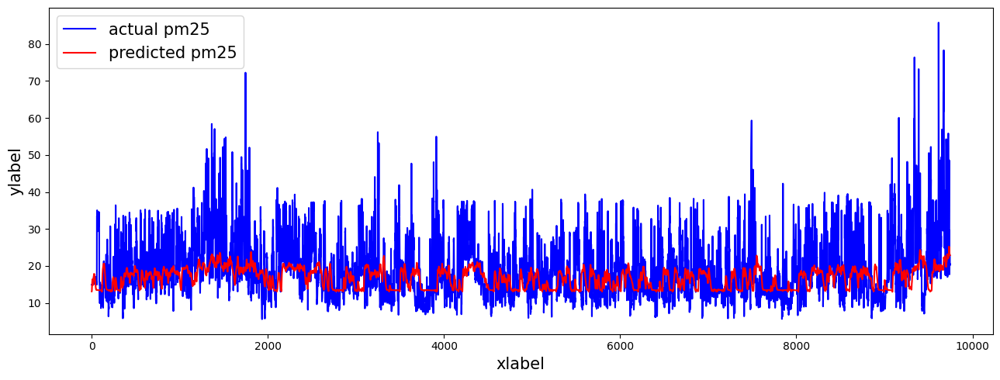

Day = 56
mae: 6.113762747974427
mse: 74.51340368672791
rmse: 8.632114670619703
r2: -9.850951920208876
mape: 0.37170809689273604
mnbe: -13.112330921280883
r_coeff: [0.19080195]


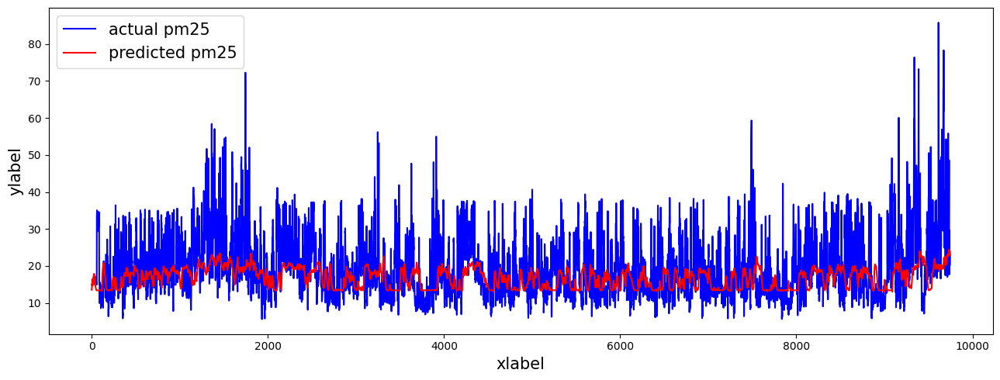

Day = 57
mae: 6.131906977222607
mse: 74.57798349718945
rmse: 8.63585453196089
r2: -8.052685554960567
mape: 0.37197291098931334
mnbe: -12.504961920268432
r_coeff: [0.18945999]


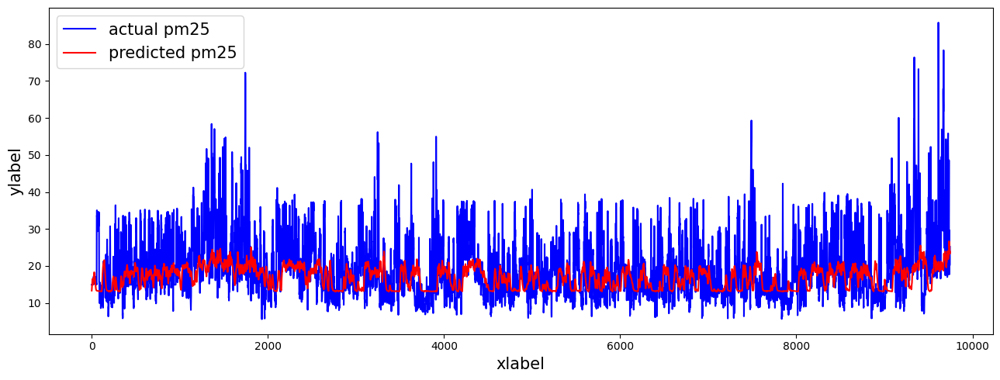

Day = 58
mae: 6.116019208992802
mse: 74.71587232625069
rmse: 8.643834353239926
r2: -9.561217490034059
mape: 0.37298202653564455
mnbe: -13.344097378184244
r_coeff: [0.1934915]


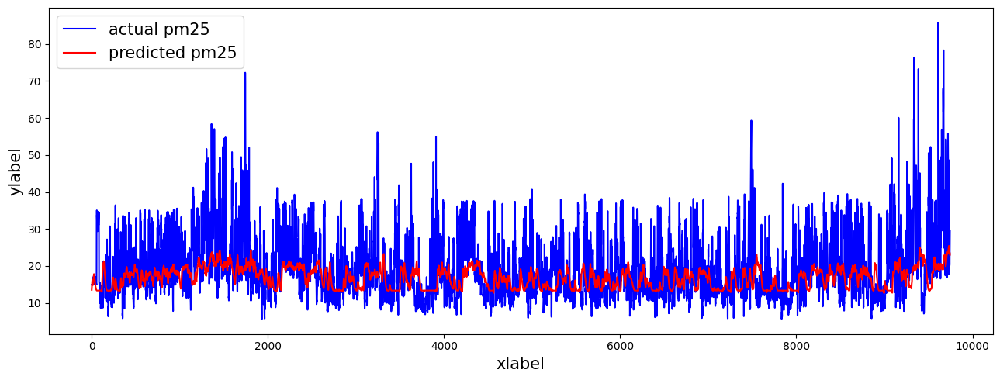

Day = 59
mae: 6.15629053768337
mse: 75.52423856612445
rmse: 8.690468259312869
r2: -7.975760666480756
mape: 0.3790845126343722
mnbe: -13.495351851961903
r_coeff: [0.19170259]


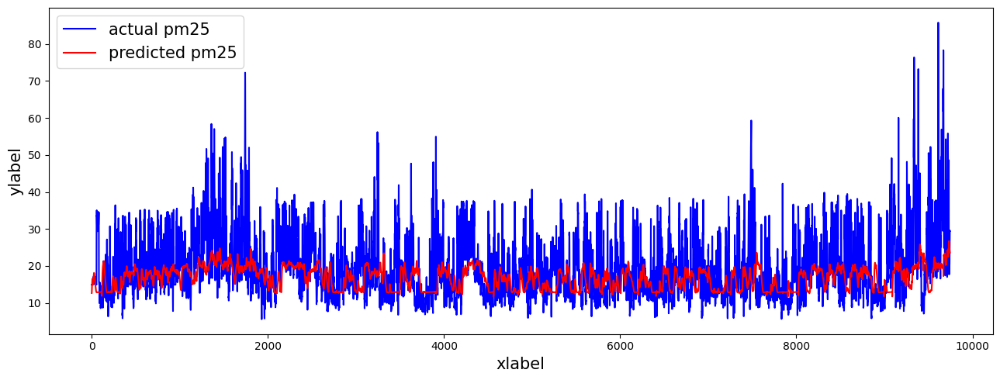

Day = 60
mae: 6.115344563220555
mse: 74.30391171744749
rmse: 8.619971677299612
r2: -7.884334291173667
mape: 0.371131463073223
mnbe: -12.544684567876926
r_coeff: [0.19760708]


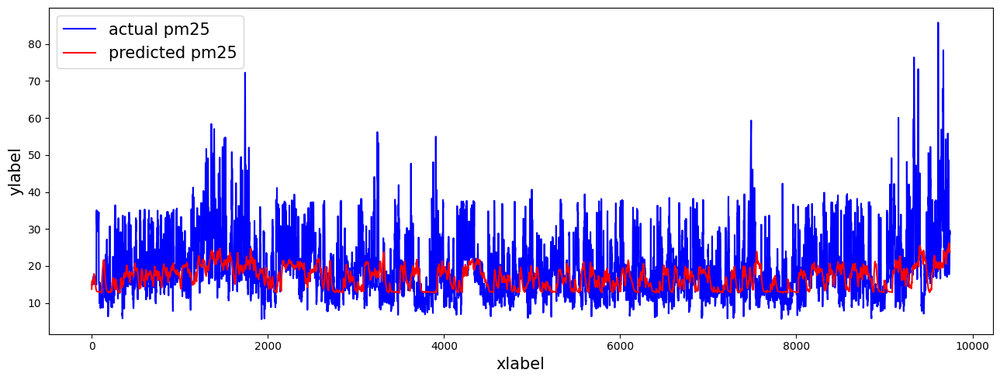

Day = 61
mae: 6.167354877015957
mse: 76.25457580516388
rmse: 8.732386604197266
r2: -8.14447929987301
mape: 0.3837072868907804
mnbe: -14.340507521535123
r_coeff: [0.19439945]


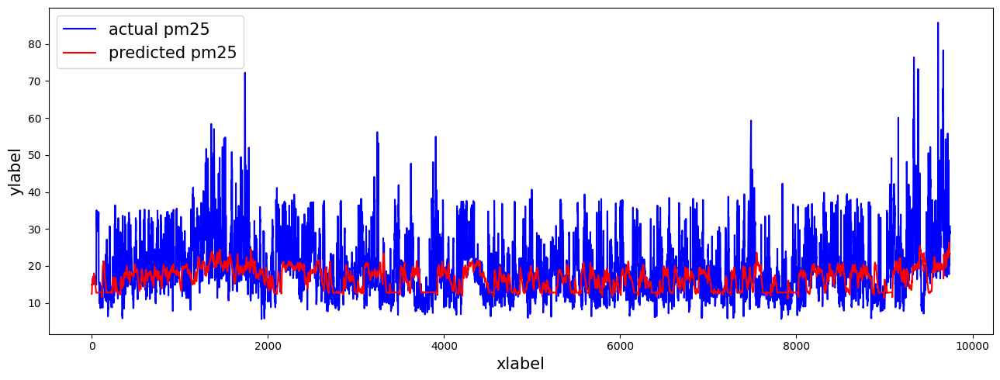

Day = 62
mae: 6.1047331531361175
mse: 74.75016739421606
rmse: 8.645817913547338
r2: -9.34659161677392
mape: 0.37337840788343674
mnbe: -13.597731864668654
r_coeff: [0.20046393]


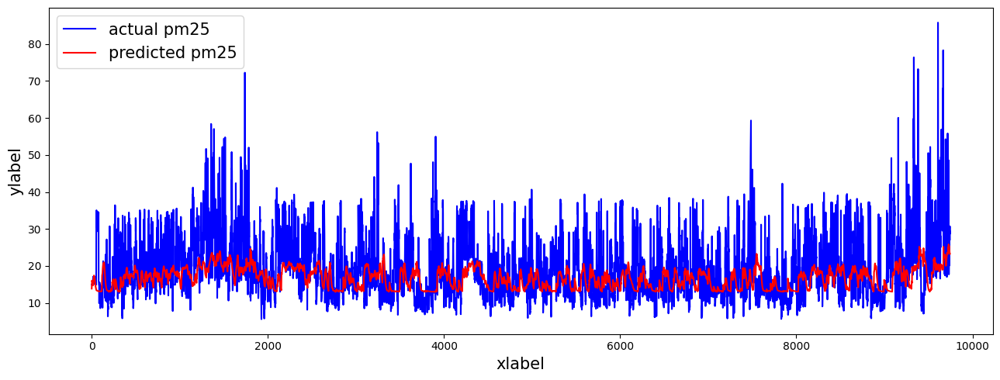

Day = 63
mae: 6.1291360073255365
mse: 75.7122836433567
rmse: 8.701280574912907
r2: -9.330358750790808
mape: 0.37960487763206363
mnbe: -14.458277106206932
r_coeff: [0.19990498]


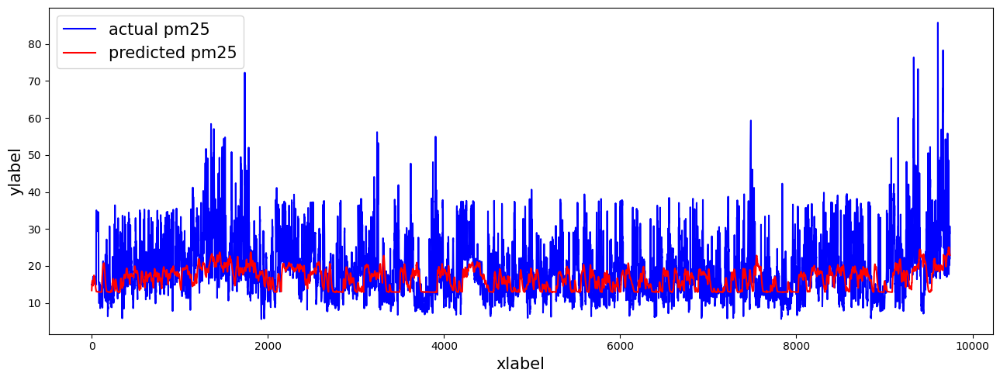

Day = 64
mae: 6.119133431537674
mse: 74.88038679324282
rmse: 8.653345410489681
r2: -8.244811433049515
mape: 0.3753421773580008
mnbe: -13.543853137781442
r_coeff: [0.20394513]


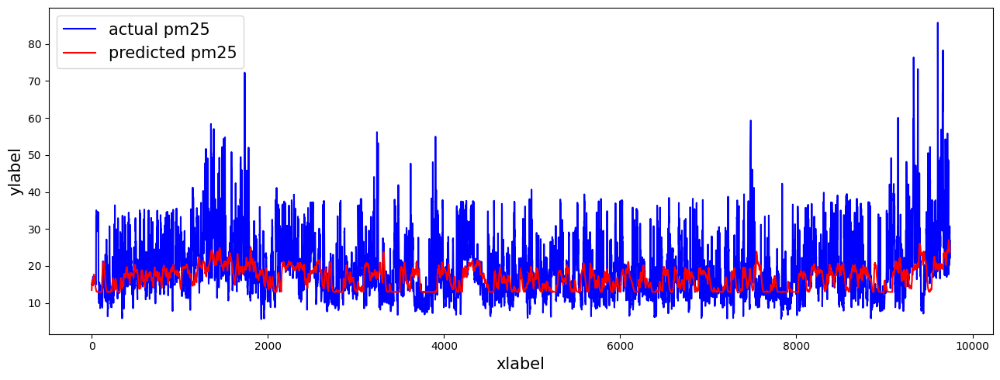

Day = 65
mae: 6.145784125447353
mse: 76.5584367920406
rmse: 8.749767813607432
r2: -8.948843989223468
mape: 0.3848169530282453
mnbe: -15.41753075770807
r_coeff: [0.2079558]


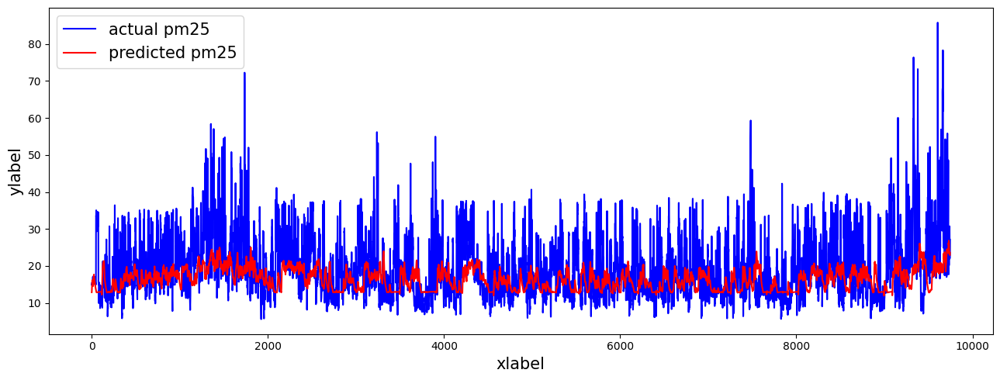

Day = 66
mae: 6.135304478051581
mse: 75.80755047113922
rmse: 8.706753153221884
r2: -9.074707512424991
mape: 0.37974393019189795
mnbe: -14.461973155542593
r_coeff: [0.20028538]


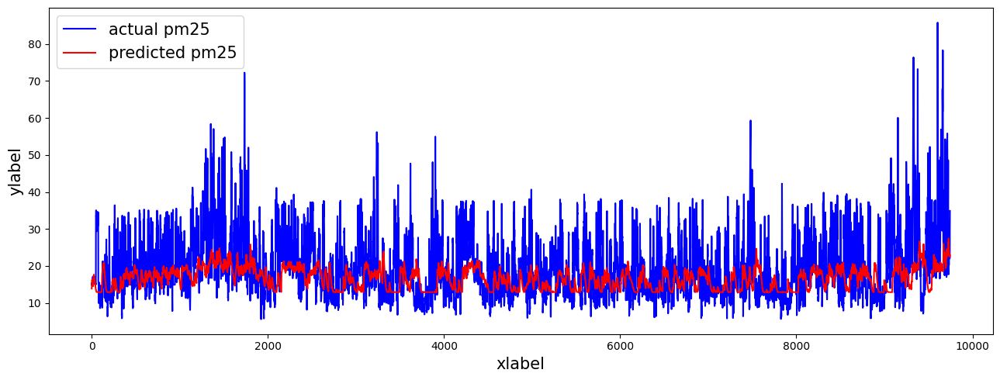

Day = 67
mae: 6.1574131262655465
mse: 76.25263071349003
rmse: 8.732275231203493
r2: -8.529176220583153
mape: 0.3834353936996871
mnbe: -14.811813144591108
r_coeff: [0.20358222]


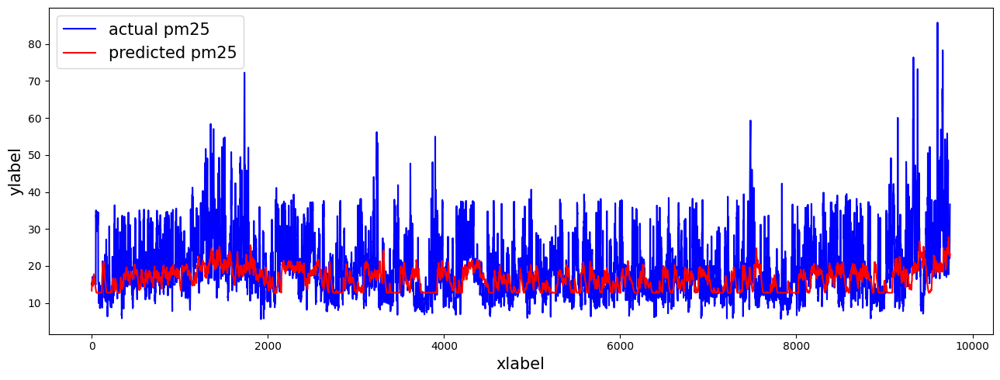

Day = 68
mae: 6.198787930611724
mse: 77.69773359122004
rmse: 8.814631789883231
r2: -9.600846168649003
mape: 0.3912854143498045
mnbe: -15.957000714997022
r_coeff: [0.19593869]


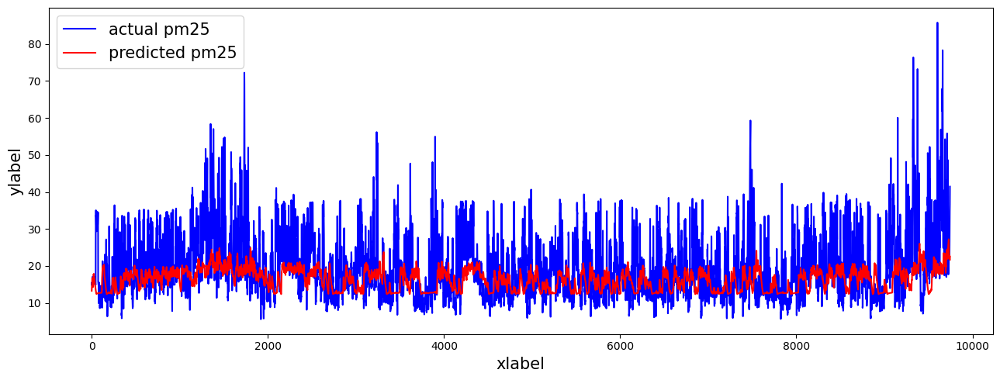

Day = 69
mae: 6.204803114629913
mse: 77.79890221573537
rmse: 8.82036859863211
r2: -9.326413316851974
mape: 0.3911829724208072
mnbe: -15.928413351447512
r_coeff: [0.19685601]


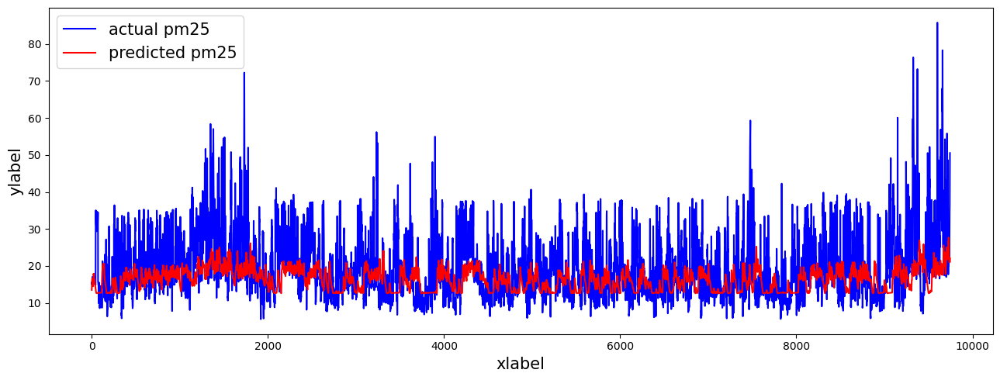

Day = 70
mae: 6.1804671700446825
mse: 77.11700859411349
rmse: 8.781629039882834
r2: -9.321219474999118
mape: 0.38703101365097525
mnbe: -15.619081469358258
r_coeff: [0.2060147]


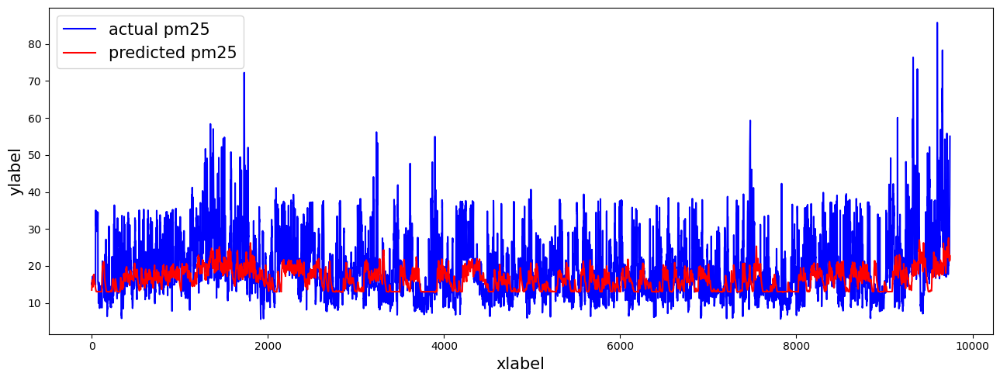

Day = 71
mae: 6.186191554493523
mse: 77.34982325755598
rmse: 8.79487482898739
r2: -10.116248310080959
mape: 0.38810176855545914
mnbe: -15.768139289690975
r_coeff: [0.20060716]


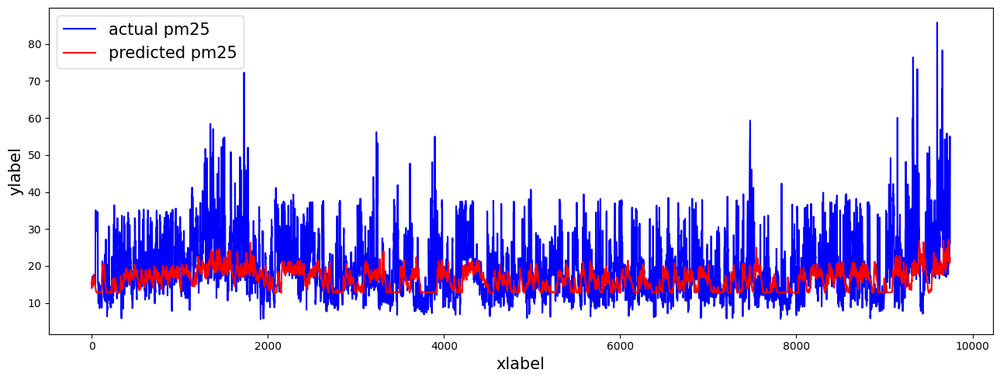

In [12]:
n_future = 72
X_train, y_train, X_test, y_test = X_train_72h, y_train_72h, X_test_72h, y_test_72h

lstms2s_72h = define_lstms2s_model(n_past, n_future, X_train.shape[-1], y_train.shape[-1], f"{label}_lstms2s_{n_future}h")

history = lstms2s_72h.fit(X_train, y_train,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred = lstms2s_72h.predict(X_test)
print(f"y_pred.shape = {y_pred.shape}")

# Save model
lstms2s_72h.save(os.path.join(RESULT_DIR, f"{lstms2s_72h.name}.keras"))

inv_y_pred = np.expand_dims(label_scaler.inverse_transform(y_pred), -1)
inv_y_test = np.expand_dims(label_scaler.inverse_transform(y_test[:, :, 0]), -1)
print(f"inv_y_pred.shape = {inv_y_pred.shape}\ninv_y_test.shape = {inv_y_test.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred[:, day, :], inv_y_test[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")